In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
#tensorflow.random.set_seed(2)
from tensorflow import keras
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [3]:
dfx0=pd.read_pickle('data/orbit0x_oct23.pkl')
dfy0=pd.read_pickle('data/orbit0y_oct23.pkl')

dfx0 = dfx0.add_suffix('_x')
dfy0 = dfy0.add_suffix('_y')

In [50]:
df=pd.read_pickle('data/gap_orbit_OCT23_130113.pkl')
gap = df.columns[df.columns.str.startswith('PU')]

x = df.columns[df.columns.str.endswith('_x')]
y = df.columns[df.columns.str.endswith('_y')]

In [74]:
bpms   =df.columns[df.columns.str.startswith('BPM')]

#dfx0=dfx0[bpms[:(int(len(bpms)/2))]]
#dfy0=dfy0[bpms[(int(len(bpms)/2)):len(bpms)]]

In [62]:
df[x]=df[x]-dfx0

In [63]:
df[y]=df[y]-dfy0

In [75]:
df[x]

,BPM_SWR_13_x,BPM_SWR_31_x,BPM_SWR_46_x,BPM_SWR_61_x,BPM_SWR_75_x,BPM_SWR_90_x,BPM_SWR_104_x,BPM_SWR_118_x,BPM_SWR_133_x,BPM_WL_140_x,...,BPM_SWL_90_x,BPM_SWL_75_x,BPM_SWL_61_x,BPM_SWL_46_x,BPM_SWL_39_x,BPM_SWL_31_x,BPM_SWL_13_x,BPM_SWL_1_x,BPM_SOR_67_x,BPM_SOL_24_x
0,283599.0,662626.0,295313.0,117859.0,852186.0,331841.0,263544.0,192580.0,1253110.0,309031.0,...,351777.0,342412.0,264077.0,186017.0,128692.0,1830785.0,-1254030.0,-151619.0,357245.0,-17239.0
1,263276.0,612940.0,283977.0,154239.0,882361.0,320942.0,226106.0,181839.0,1283915.0,334140.0,...,386303.0,341057.0,224180.0,172824.0,157352.0,1876594.0,-1203502.0,-128007.0,387354.0,20778.0
2,244220.0,572879.0,276920.0,184408.0,904586.0,309584.0,197223.0,176139.0,1309572.0,351397.0,...,412683.0,337245.0,191792.0,164220.0,183861.0,1915273.0,-1165104.0,-112727.0,408106.0,117068.0
3,207267.0,521454.0,277072.0,226357.0,923563.0,285754.0,164536.0,181466.0,1345135.0,362798.0,...,440776.0,322638.0,148967.0,160926.0,232874.0,1972908.0,-1123022.0,-105914.0,400904.0,19263.0
4,204867.0,518204.0,276932.0,228935.0,924531.0,283926.0,162255.0,181872.0,1347515.0,363325.0,...,442116.0,321830.0,146763.0,160675.0,235439.0,1975864.0,-1121197.0,-106004.0,402081.0,24078.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,361022.0,587998.0,202634.0,146829.0,980425.0,396743.0,169551.0,72671.0,1276845.0,441366.0,...,466049.0,438105.0,212029.0,90782.0,35395.0,1828420.0,-1102061.0,8938.0,577727.0,26865.0
298,359642.0,587529.0,203430.0,147410.0,980002.0,395837.0,169664.0,73751.0,1277394.0,440787.0,...,465712.0,436348.0,211433.0,92090.0,38039.0,1830641.0,-1102499.0,7407.0,576488.0,42663.0
299,358556.0,589223.0,204655.0,146443.0,977884.0,395227.0,171717.0,75728.0,1276657.0,438431.0,...,462383.0,435132.0,214057.0,94197.0,38706.0,1828708.0,-1107010.0,4099.0,575441.0,103984.0
300,361557.0,590390.0,203408.0,144967.0,978658.0,397238.0,171773.0,73584.0,1275196.0,439879.0,...,463522.0,437591.0,214673.0,92313.0,34626.0,1826249.0,-1105940.0,7018.0,577766.0,51255.0


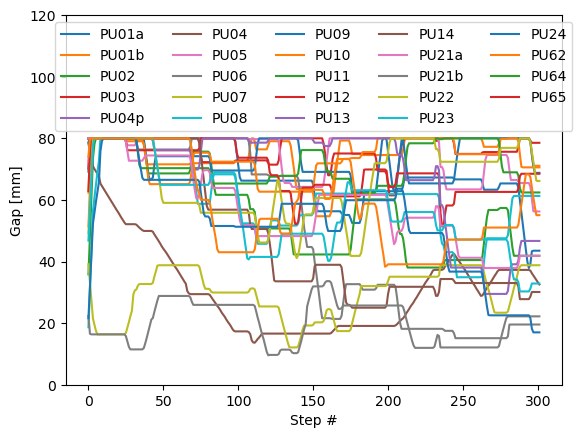

In [174]:
f, ax = plt.subplots()
for cols in gap:
    ax.plot(df.index,df[cols],label=cols)
ax.set_xlabel("Step #")
ax.set_ylabel("Gap [mm]")
plt.legend(ncol=5,loc='upper center')
ax.set_ylim((0,120))
f.savefig('IDs_all_movements.png')

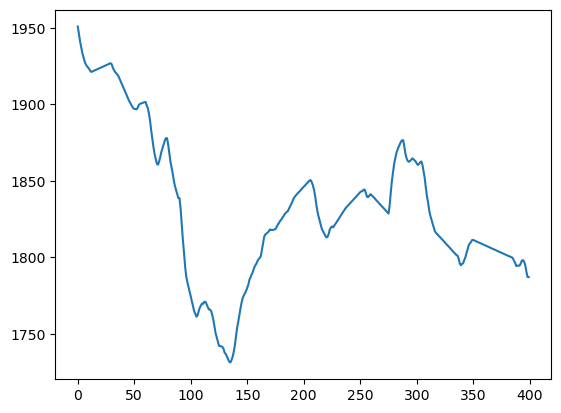

In [7]:
plt.plot(np.sum(df[gap],axis=1))

In [8]:
df_train = pd.read_csv('C:/Users/veglia/Desktop/P3_NN_project/data/full_data_all_PUs.csv',index_col=0)
df_train=df_train.drop(columns=['BPM_OR_17_x','BPM_OR_17_y'])
x_tr = df_train.columns[df_train.columns.str.endswith('_x')]
y_tr = df_train.columns[df_train.columns.str.endswith('_y')]
gap_tr = df_train.columns[df_train.columns.str.startswith('pu')]
x_in=df_train[gap_tr].to_numpy()
z=np.hstack((df_train[x_tr].to_numpy(),df_train[y_tr].to_numpy()))

In [9]:
x_train,x_test,y_train,y_test = train_test_split(x_in, z, test_size=0.1, shuffle=True)

x_scaler = StandardScaler()
x_train_scaled = x_scaler.fit_transform(x_train)
x_test_scaled = x_scaler.transform(x_test)

y_scaler = StandardScaler()
y_train_scaled = y_scaler.fit_transform(y_train)
y_test_scaled = y_scaler.transform(y_test)

In [10]:
path='C:/Users/veglia/Desktop/P3_NN_project/deep_FFNN_gap2orbit_best_model_24.pt'
model=tf.keras.models.load_model(path,compile=False)

model.compile()

In [11]:
pathRNN='C:/Users/veglia/Desktop/P3_NN_project/RNN_model_gap2orbit_best_model_24.pt'
modelRNN=tf.keras.models.load_model(pathRNN, compile=False)

modelRNN.compile()

In [12]:
pathRNN2='C:/Users/veglia/Desktop/P3_NN_project/New_RNN_model_gap2orbit_24.pt'
modelRNN2=tf.keras.models.load_model(pathRNN2, compile=False)

modelRNN2.compile()

In [13]:
pathRNN3='C:/Users/veglia/Desktop/P3_NN_project/DeepVerticalRNN_model_gap2orbit_24new.pt'
modelRNN3=tf.keras.models.load_model(pathRNN3, compile=False)

modelRNN3.compile()

In [76]:
bpms_tr=df_train.columns[df_train.columns.str.startswith('BPM')]
bpms   =df.columns[df.columns.str.startswith('BPM')]

to_drop=list(set(bpms)-set(bpms_tr))
print(to_drop)
df=df.drop(columns=to_drop)
x = df.columns[df.columns.str.endswith('_x')]
y = df.columns[df.columns.str.endswith('_y')]



['BPM_OL_98_y', 'BPM_SWL_31_y', 'BPM_NOR_98_x', 'BPM_NOR_98_y', 'BPM_SOL_24_x', 'BPM_OL_98_x', 'BPM_SOL_24_y', 'BPM_SOR_67_y', 'BPM_NR_19_x', 'BPM_OL_144_x', 'BPM_OR_17_x', 'BPM_OL_75_x', 'BPM_NOR_52_x', 'BPM_SOR_67_x', 'BPM_NR_19_y', 'BPM_NOR_52_y', 'BPM_OL_75_y', 'BPM_OL_144_y', 'BPM_OR_17_y', 'BPM_SWL_31_x']


In [77]:
x_mes=df[x].to_numpy()
y_mes=df[y].to_numpy()
print(x_mes.shape)
print(y_mes.shape)

(302, 238)
(302, 238)


In [78]:
df.insert(4,'PU04p',147.00)
gap = df.columns[df.columns.str.startswith('PU')]

ValueError: cannot insert PU04p, already exists

In [54]:
x_try=df[gap].to_numpy()
x_try_scaled = x_scaler.transform(x_try)

y_scaled=model.predict(x_try_scaled)
y_out=y_scaler.inverse_transform(y_scaled)

y_scaledRNN=modelRNN.predict(x_try_scaled)
y_outRNN=y_scaler.inverse_transform(y_scaledRNN)

y_scaledRNN2=modelRNN2.predict(x_try_scaled)
y_outRNN2=y_scaler.inverse_transform(y_scaledRNN2)

y_scaledRNN3=modelRNN3.predict(x_try_scaled)
y_outRNN3=y_scaler.inverse_transform(y_scaledRNN3)

10/10 [==============================] - 0s 14ms/step


In [55]:
y_try=np.hstack((df[x].to_numpy(),df[y].to_numpy()))

In [54]:
sum_arr=np.where(np.sum(x_try,axis=1)<2300)
len(sum_arr[0])

302

In [ ]:
plt.plot(y_try[:,:238]*1e-6)

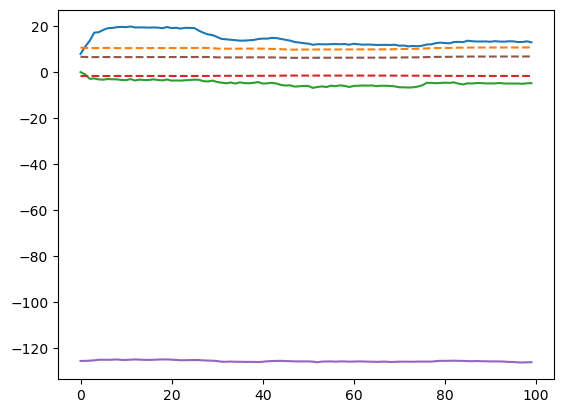

In [57]:
for i in [8,80,457,204,198]:
    plt.plot(y_try[:100,i]*1e-4)
    plt.plot(y_out[:100,i],linestyle='--')

In [ ]:
plt.plot(y_out[:,:238])
#plt.plot(df['BPM_SWR_31_x']*0.5e-7)

In [19]:
df[x]

,BPM_SWR_13_x,BPM_SWR_31_x,BPM_SWR_46_x,BPM_SWR_61_x,BPM_SWR_75_x,BPM_SWR_90_x,BPM_SWR_104_x,BPM_SWR_118_x,BPM_SWR_133_x,BPM_WL_140_x,...,BPM_SWL_133_x,BPM_SWL_118_x,BPM_SWL_104_x,BPM_SWL_90_x,BPM_SWL_75_x,BPM_SWL_61_x,BPM_SWL_46_x,BPM_SWL_39_x,BPM_SWL_13_x,BPM_SWL_1_x
0,402054.0,619178.0,225821.0,149296.0,878754.0,309445.0,181196.0,229457.0,1313086.0,321441.0,...,138616.0,-1408890.0,-936872.0,385366.0,277963.0,234953.0,154572.0,49817.0,-1155341.0,-73984.0
1,396531.0,618770.0,228149.0,150792.0,876613.0,307002.0,181991.0,234485.0,1314465.0,319123.0,...,138874.0,-1404915.0,-934775.0,383006.0,274668.0,235378.0,158394.0,54713.0,-1157688.0,-78516.0
2,394379.0,617566.0,230376.0,152730.0,874313.0,303908.0,182526.0,235838.0,1315948.0,316067.0,...,137394.0,-1403264.0,-932637.0,382381.0,271481.0,233683.0,159254.0,59389.0,-1158890.0,-81457.0
3,402741.0,622817.0,227422.0,147342.0,876057.0,309926.0,184128.0,231196.0,1311353.0,319365.0,...,141576.0,-1406212.0,-938264.0,382247.0,277658.0,238449.0,156377.0,48395.0,-1159910.0,-77023.0
4,401396.0,614291.0,223899.0,153156.0,882645.0,309531.0,176826.0,226794.0,1315927.0,325544.0,...,135759.0,-1412464.0,-936252.0,389746.0,279577.0,231880.0,152293.0,50319.0,-1149420.0,-70310.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,518136.0,591586.0,130268.0,139282.0,995190.0,401172.0,115754.0,99854.0,1302404.0,448655.0,...,126099.0,-1536560.0,-999988.0,477331.0,395053.0,225418.0,58543.0,-97625.0,-1039711.0,86538.0
396,516371.0,594194.0,132256.0,138261.0,992276.0,400260.0,118171.0,102696.0,1301657.0,445272.0,...,127771.0,-1533318.0,-999569.0,474610.0,393062.0,226932.0,60857.0,-95806.0,-1043539.0,82335.0
397,511119.0,591006.0,134300.0,141459.0,991172.0,396508.0,117596.0,105778.0,1304388.0,443492.0,...,125229.0,-1531087.0,-995810.0,474880.0,389245.0,224290.0,62745.0,-89051.0,-1043237.0,79507.0
398,503737.0,586635.0,137240.0,145774.0,989519.0,391603.0,116360.0,109869.0,1307729.0,440849.0,...,122073.0,-1527520.0,-991044.0,474121.0,384185.0,220406.0,65660.0,-79735.0,-1042703.0,74628.0


C:\Users\veglia\AppData\Local\Temp\ipykernel_23852\1364786087.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize=(7,10))


<Figure size 700x1000 with 0 Axes>

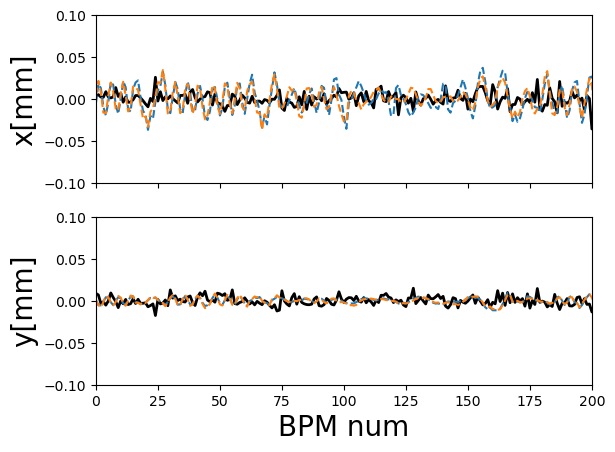

<Figure size 700x1000 with 0 Axes>

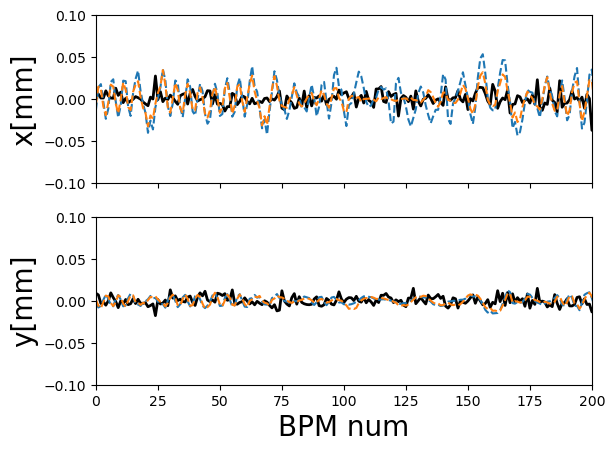

<Figure size 700x1000 with 0 Axes>

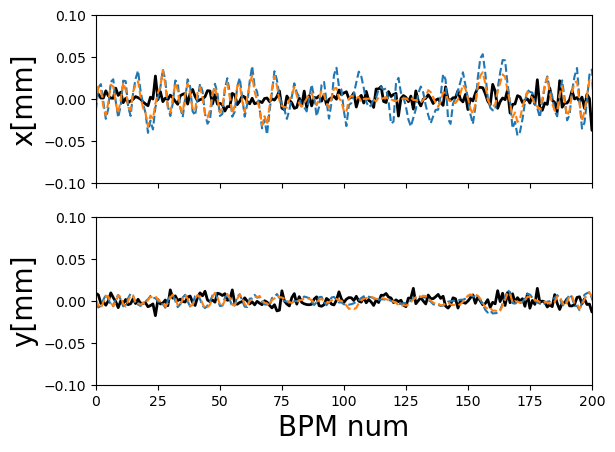

<Figure size 700x1000 with 0 Axes>

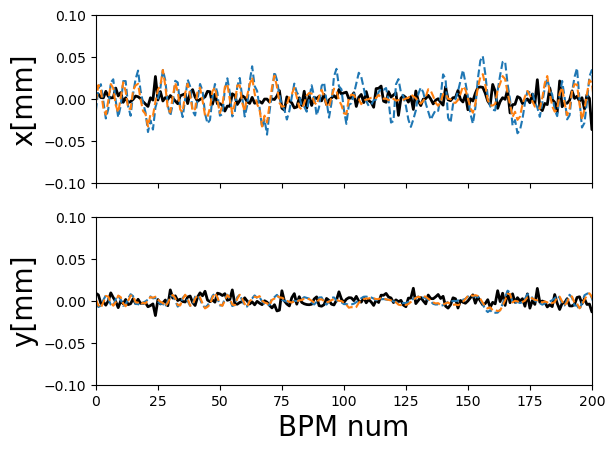

<Figure size 700x1000 with 0 Axes>

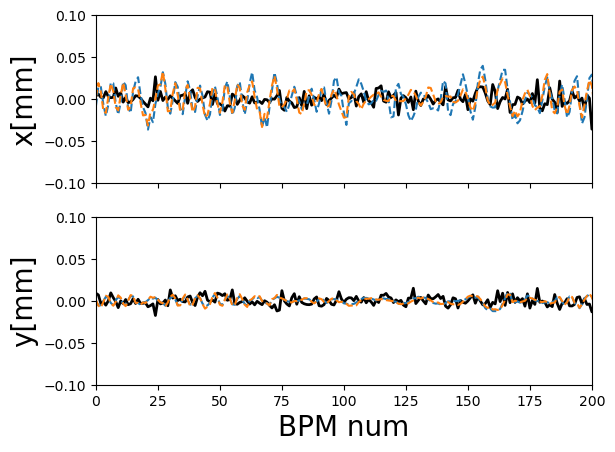

<Figure size 700x1000 with 0 Axes>

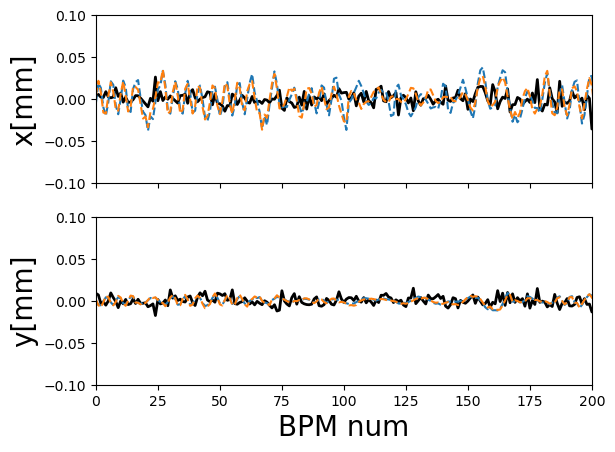

<Figure size 700x1000 with 0 Axes>

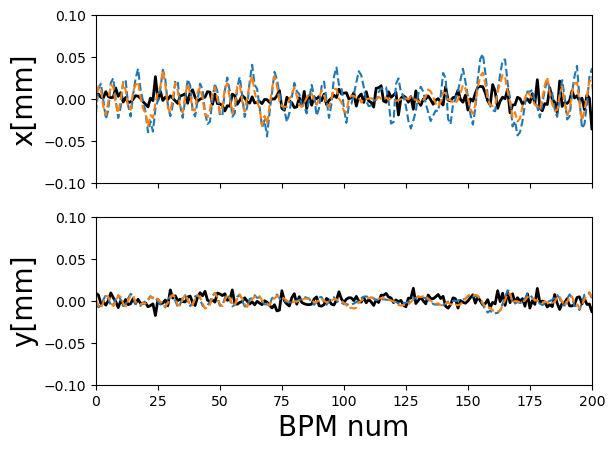

<Figure size 700x1000 with 0 Axes>

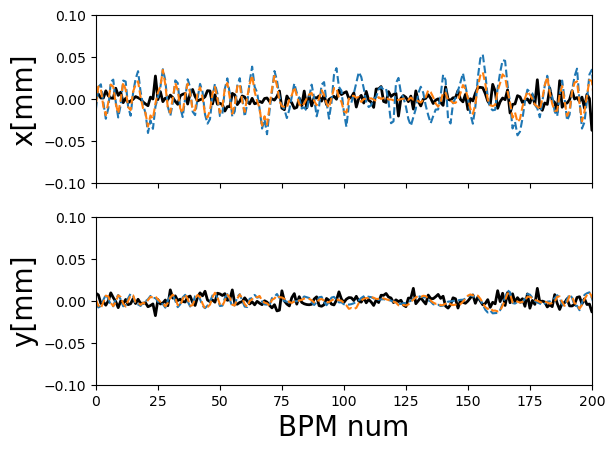

<Figure size 700x1000 with 0 Axes>

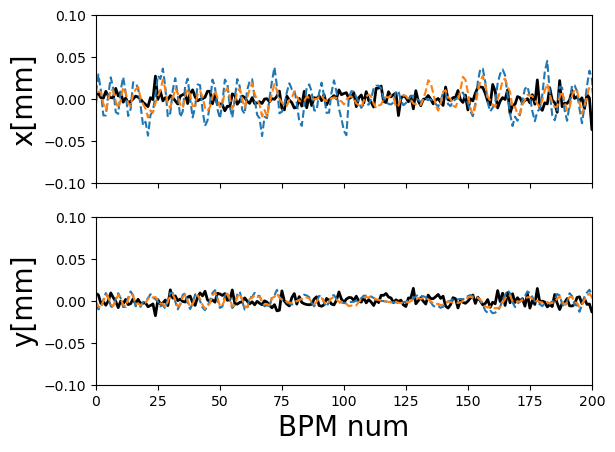

<Figure size 700x1000 with 0 Axes>

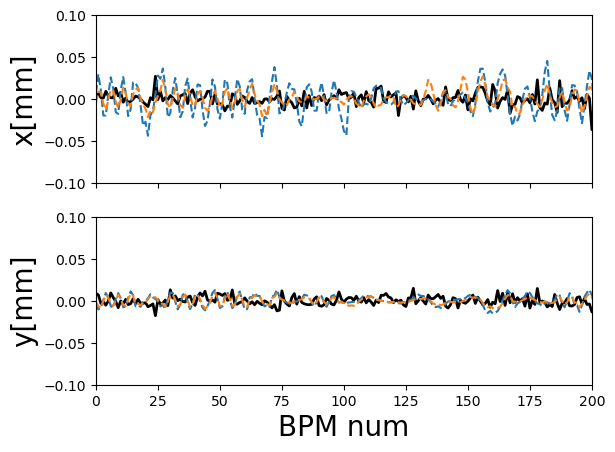

<Figure size 700x1000 with 0 Axes>

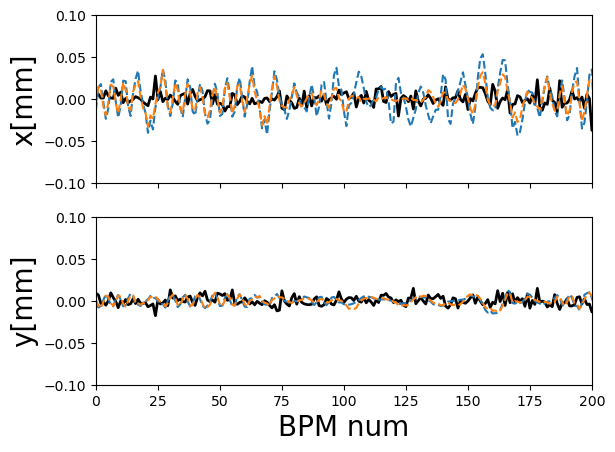

<Figure size 700x1000 with 0 Axes>

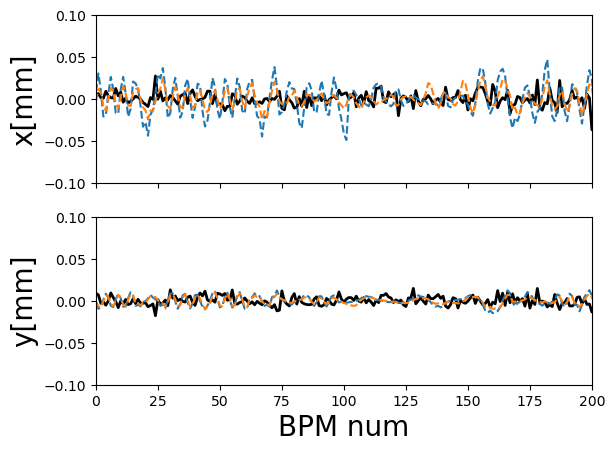

<Figure size 700x1000 with 0 Axes>

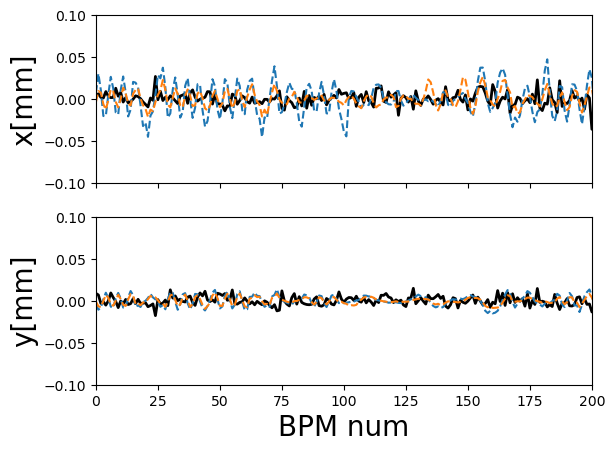

<Figure size 700x1000 with 0 Axes>

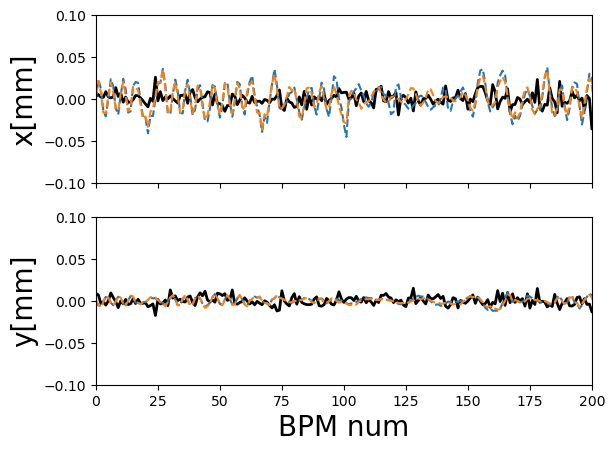

<Figure size 700x1000 with 0 Axes>

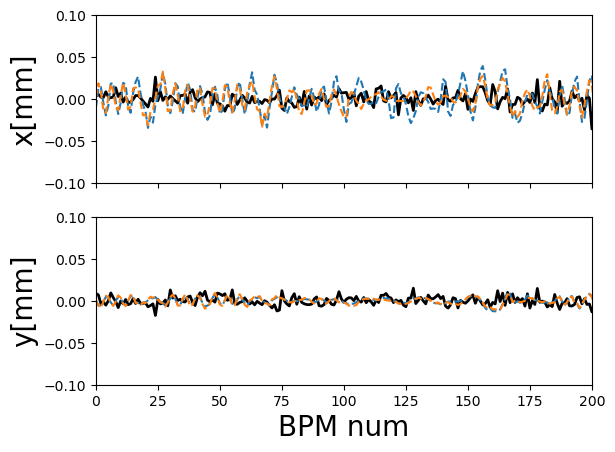

In [21]:
for i in np.random.choice(len(x_try),15):
    fig=plt.figure(figsize=(7,10))
    _,(ax1,ax2)= plt.subplots(2,sharex='col')
    #ax1.plot(y_test[i,:238],c='k',linewidth=2)
    ax1.plot(y_try[i,:238]*1e-8,c='k',linewidth=2)
    #ax1.plot(x_mes[i]*1e-5,c='k',linewidth=2)
    #ax1.plot(y_out[i,:238],linestyle='--')
    ax1.plot(y_outRNN3[i,:238],linestyle='--')
    ax1.plot(y_outRNN2[i,:238],linestyle='--')

    #ax1.set_xlabel('BPM num',fontsize=20)
    #ax1.title.set_text(x_try[i])
    ax1.set_ylabel('x[mm]',fontsize=20)
    ax1.set_xlim(0,200)
    ax1.set_ylim(-0.1,0.1)
    #ax1.set_title("Horizontal",fontsize=20)

    #ax2.set_title('gaps sum= '+str(sum(x_try[i])),fontsize=15)
    #ax2.plot(z[i,238:],c='k',linewidth=2.5)
    ax2.plot(y_try[i,238:]*1e-8,c='k',linewidth=2)
    #ax2.plot(y_mes[i]*1e-6,c='k',linewidth=2)
    #ax2.plot(y_out[i,238:]*1,linestyle='--')
    ax2.plot(y_outRNN3[i,238:],linestyle='--')
    ax2.plot(y_outRNN2[i,238:],linestyle='--')

    ax2.set_xlim(0,200)
    ax2.set_ylim(-0.1,0.1)
    ax2.set_xlabel('BPM num',fontsize=20)
    ax2.set_ylabel('y[mm]',fontsize=20)

In [29]:
x_try=x_train
x_try_scaled = x_scaler.transform(x_try)

y_scaled=model.predict(x_try_scaled)
y_out=y_scaler.inverse_transform(y_scaled)

y_scaledRNN=modelRNN.predict(x_try_scaled)
y_outRNN=y_scaler.inverse_transform(y_scaledRNN)

y_scaledRNN2=modelRNN2.predict(x_try_scaled)
y_outRNN2=y_scaler.inverse_transform(y_scaledRNN2)

y_scaledRNN3=modelRNN3.predict(x_try_scaled)
y_outRNN3=y_scaler.inverse_transform(y_scaledRNN3)

436/436 [==============================] - 1s 1ms/step


ValueError: operands could not be broadcast together with shapes (13938,476) (478,) (13938,476) 

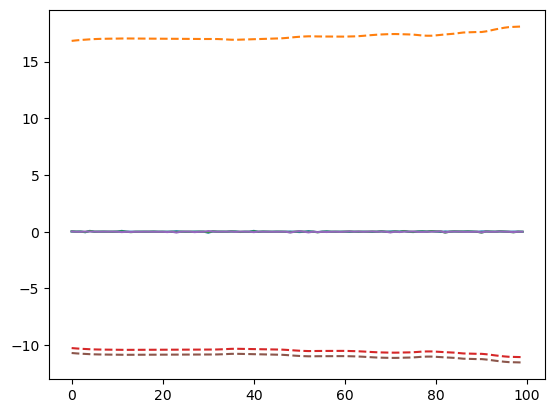

In [22]:
for i in [157,204,198]:
    plt.plot(y_train[:100,i])
    plt.plot(y_out[:100,i],linestyle='--')

In [ ]:
for i in np.random.choice(len(x_try),15):
    fig=plt.figure(figsize=(7,10))
    _,(ax1,ax2)= plt.subplots(2,sharex='col')
    #ax1.plot(y_test[i,:238],c='k',linewidth=2)
    #ax1.plot(y_try[i,:238]*1e-7,c='k',linewidth=2)
    #ax1.plot(x_train[i]*1e-6,c='k',linewidth=2)
    ax1.plot(y_train[i,:238],c='k',linewidth=2.5)
    ax1.plot(y_out[i,:238],linestyle='--')
    #ax1.plot(y_outRNN[i,:238],linestyle='--')
    ax1.plot(y_outRNN3[i,:238],linestyle='--')

    #ax1.set_xlabel('BPM num',fontsize=20)
    #ax1.title.set_text(x_try[i])
    ax1.set_ylabel('x[mm]',fontsize=20)
    #ax1.set_title("Horizontal",fontsize=20)

    #ax2.set_title('gaps sum= '+str(sum(x_try[i])),fontsize=15)
    #ax2.plot(z[i,238:],c='k',linewidth=2.5)
    #ax2.plot(y_try[i,238:]*1e-8,c='k',linewidth=2)
    ax2.plot(y_train[i,238:],c='k',linewidth=2.5)
    ax2.plot(y_out[i,238:],linestyle='--')
    #ax2.plot(y_outRNN[i,238:],linestyle='--')
    ax2.plot(y_outRNN3[i,238:],linestyle='--')


    ax2.set_xlabel('BPM num',fontsize=20)
    ax2.set_ylabel('y[mm]',fontsize=20)

In [108]:
x_try=x_test
x_try_scaled = x_scaler.transform(x_try)

y_scaled=model.predict(x_try_scaled)
y_out=y_scaler.inverse_transform(y_scaled)

y_scaledRNN=modelRNN.predict(x_try)
y_outRNN=y_scaler.inverse_transform(y_scaledRNN)

y_scaledRNN2=modelRNN3.predict(x_try)
y_outRNN2=y_scaler.inverse_transform(y_scaledRNN2)

49/49 [==============================] - 0s 7ms/step


<Figure size 700x1000 with 0 Axes>

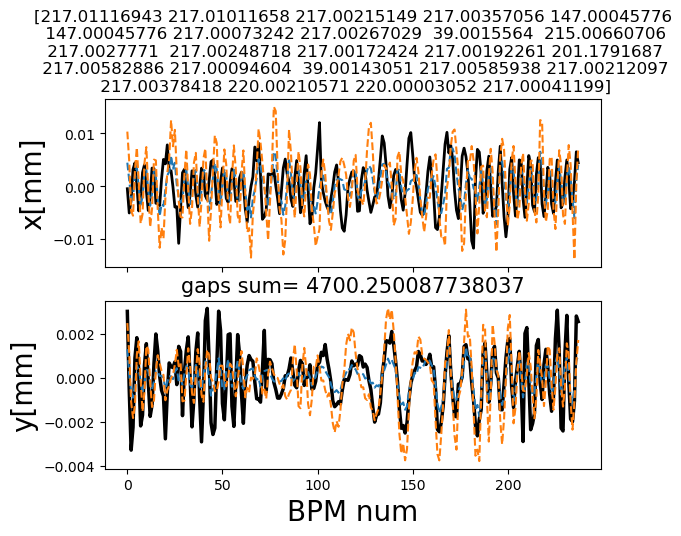

<Figure size 700x1000 with 0 Axes>

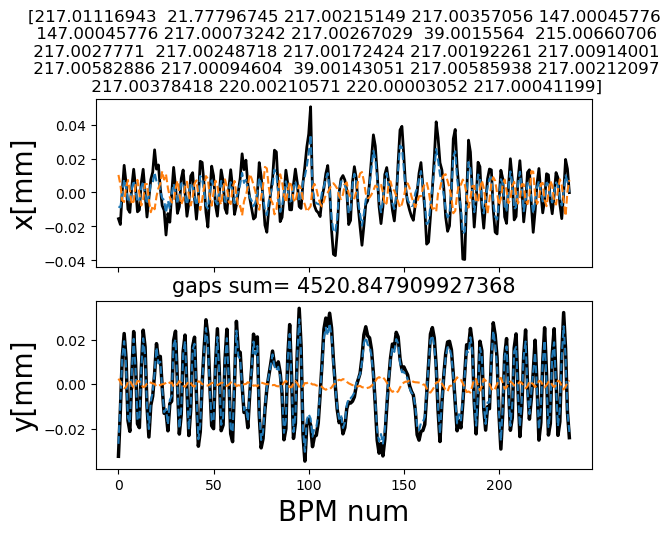

<Figure size 700x1000 with 0 Axes>

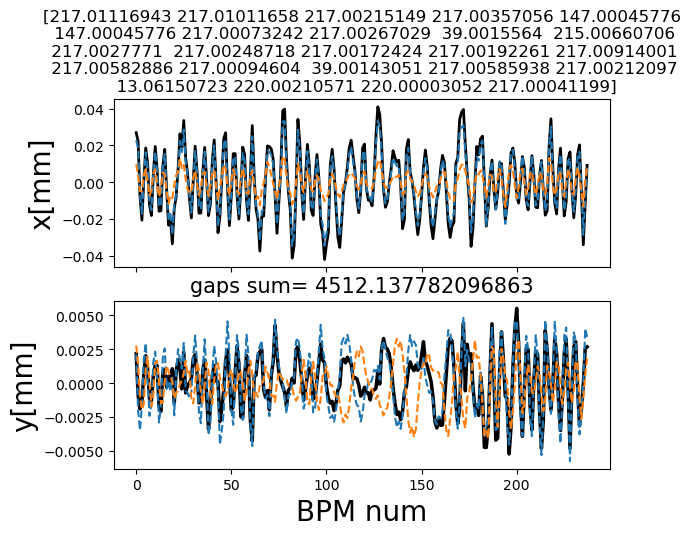

<Figure size 700x1000 with 0 Axes>

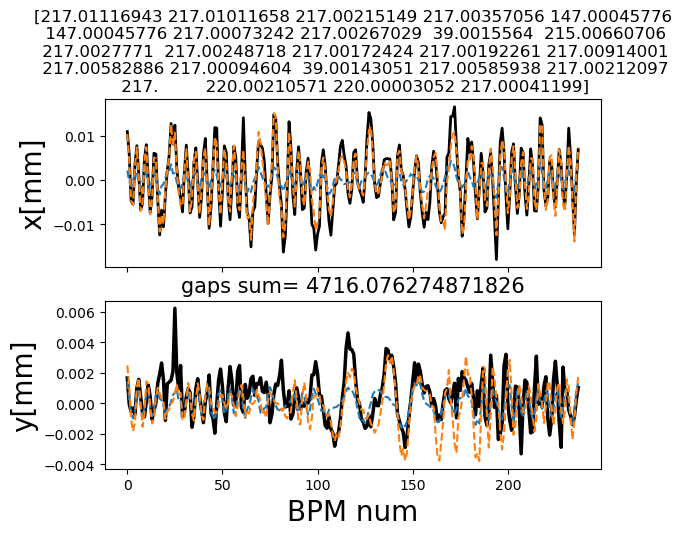

<Figure size 700x1000 with 0 Axes>

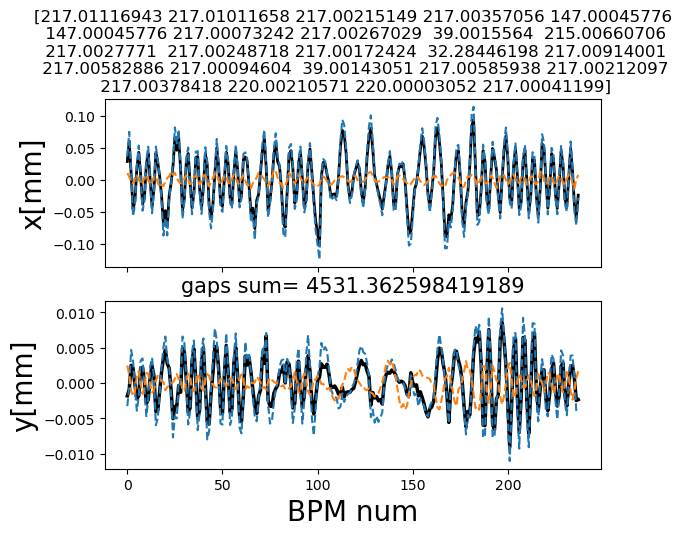

<Figure size 700x1000 with 0 Axes>

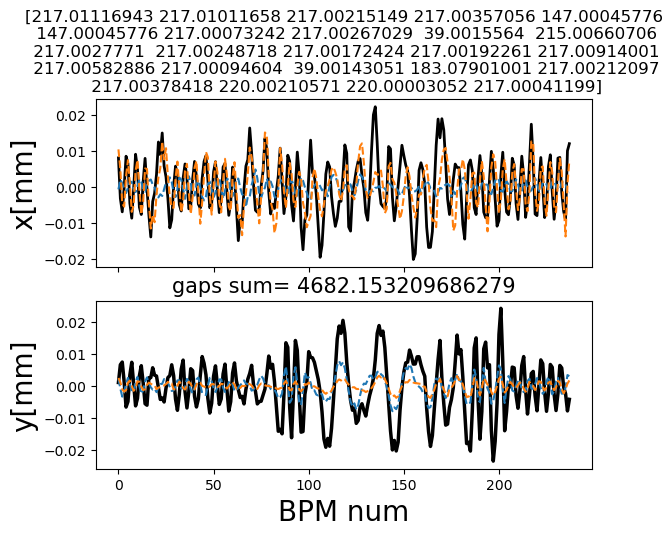

<Figure size 700x1000 with 0 Axes>

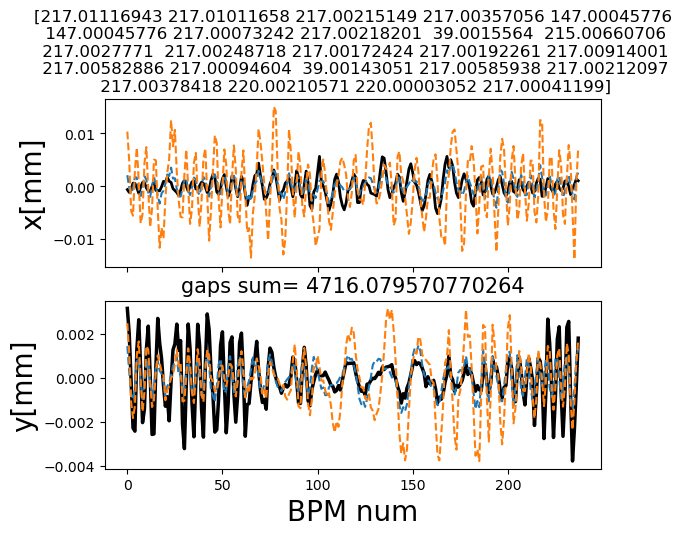

<Figure size 700x1000 with 0 Axes>

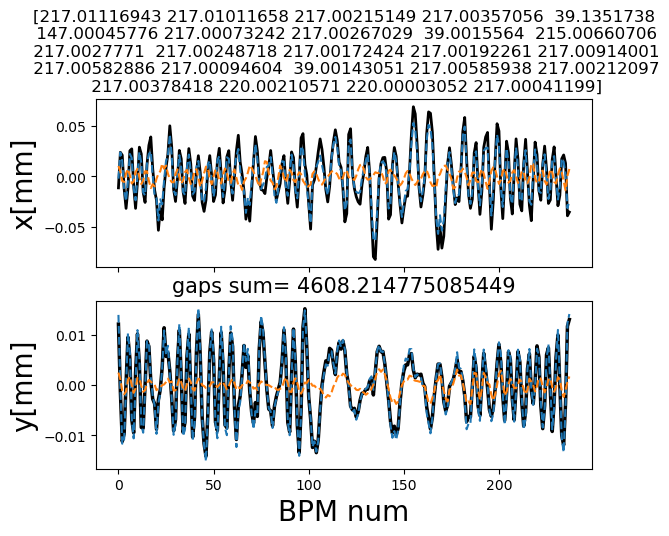

<Figure size 700x1000 with 0 Axes>

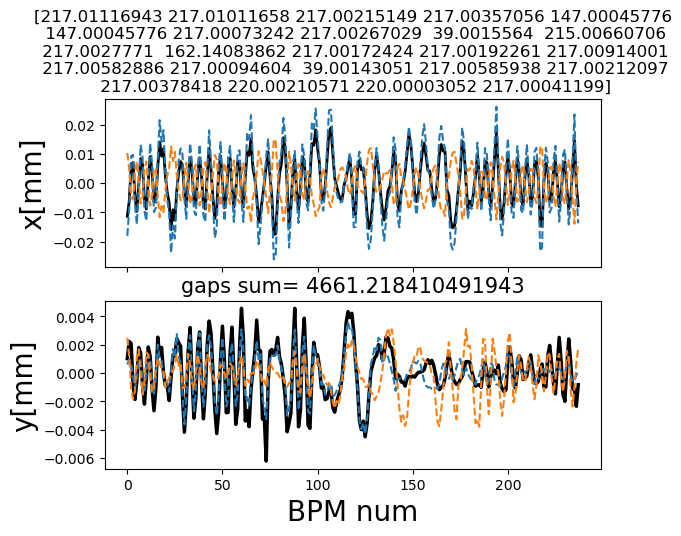

<Figure size 700x1000 with 0 Axes>

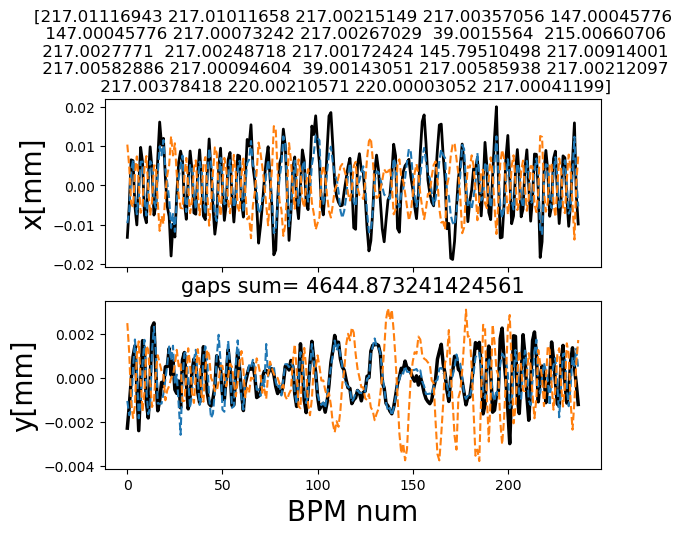

In [110]:
for i in np.random.choice(len(x_try),10):
    fig=plt.figure(figsize=(7,10))
    _,(ax1,ax2)= plt.subplots(2,sharex='col')
    ax1.plot(y_test[i,:238],c='k',linewidth=2)
    ax1.plot(y_out[i,:238],linestyle='--')
    ax1.plot(y_outRNN2[i,:238],linestyle='--')
    #ax1.plot(y_outRNN[i,:238],linestyle='--')

    #ax1.set_xlabel('BPM num',fontsize=20)
    ax1.title.set_text(x_try[i])
    ax1.set_ylabel('x[mm]',fontsize=20)
    #ax1.set_title("Horizontal",fontsize=20)

    ax2.set_title('gaps sum= '+str(sum(x_try[i])),fontsize=15)
    ax2.plot(y_test[i,238:],c='k',linewidth=2.5)
    ax2.plot(y_out[i,238:],linestyle='--')
    ax2.plot(y_outRNN2[i,238:],linestyle='--')
    #ax2.plot(y_outRNN[i,238:],linestyle='--')


    ax2.set_xlabel('BPM num',fontsize=20)
    ax2.set_ylabel('y[mm]',fontsize=20)

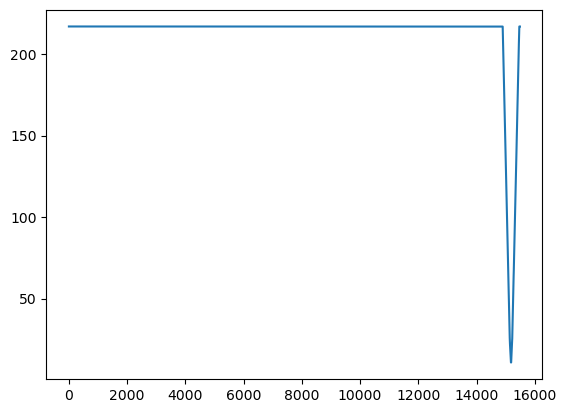

In [119]:
plt.plot(df_train.iloc[:,23])

In [23]:
import scipy.io
import scipy as sp
import scipy.interpolate
import os

directory = 'C:/Users/veglia/Desktop/P3_NN_project/data/data_matlab/'

In [24]:
names=[]
gaps=[]
bpmsl=[]
xs=[]
ys=[]
funcsx=[]
funcsy=[]

In [25]:
for filename in os.scandir(directory):
    mat = scipy.io.loadmat(filename)
    b=filename.name.split('_')
    names.append(b[1])
    a=(pd.Series(mat)).to_frame()
    a.drop(['__header__','__version__','__globals__','t'])
    bpms_p=[]
    for i in a[0]['bpmnames']:           
        bpms_p.append(i[0][0])
    bpmsl.append(bpms_p)
    gapsl=a[0]['gap'][0]
    gaps.append(gapsl)
    #_,gaps=split_list(gaps)
    x=a[0]['x'][:,:len(gapsl)].transpose()
    y=a[0]['y'][:,:len(gapsl)].transpose()
    xs.append(x)
    ys.append(y)
    fxs=[]
    fys=[]
    for j in range(len(bpms_p)):
        fx=scipy.interpolate.interp1d(gapsl,x[:,j],fill_value="extrapolate")
        fy=scipy.interpolate.interp1d(gapsl,y[:,j],fill_value="extrapolate")
        fxs.append(fx)
        fys.append(fy)
    funcsx.append(fxs)
    funcsy.append(fys)

In [26]:
lista1=list(set([i[:-2] for i in list(bpms_tr)]))
len(lista1)

238

In [27]:
from operator import itemgetter
for i in range(len(bpmsl)):
    keep=[]
    for g in lista1:
        keep.append(bpmsl[i].index(g))
    xs[i]=itemgetter(*keep)(xs[i])#[keep]
    ys[i]=itemgetter(*keep)(ys[i])
    funcsx[i]=itemgetter(*keep)(funcsx[i])
    funcsy[i]=itemgetter(*keep)(funcsy[i])

In [56]:
x_inter=[]
for h in range(len(x_try)):
    x_inter_p=[]
    for i in range(24):
        x_pred=[float(funcsx[i][j](x_try[h][i])) for j in range(238)]
        x_inter_p.append(x_pred)
    x_inter.append(x_inter_p)

In [30]:
len(y_out)

400

In [57]:
y_inter=[]
for h in range(len(x_try)):
    y_inter_p=[]
    for i in range(24):
        y_pred=[float(funcsy[i][j](x_try[h][i])) for j in range(238)]
        y_inter_p.append(y_pred)
    y_inter.append(y_inter_p)

B=np.sum(np.reshape(y_inter,((302,24,238))),axis=1)

B

array([[-0.30168992, -0.65435959, -0.13000747, ...,  0.92206242,
         0.68335768, -0.22827481],
       [ 0.02258515, -0.02002118, -0.0278597 , ...,  0.00203605,
        -0.04632079, -0.03224447],
       [ 0.01169944, -0.01834482, -0.02862045, ...,  0.00432378,
        -0.04133368, -0.02792084],
       ...,
       [ 0.02335925, -0.02110994, -0.05744003, ..., -0.00297   ,
        -0.06421376, -0.04711771],
       [ 0.02381518, -0.02153597, -0.05628113, ..., -0.0030611 ,
        -0.06437075, -0.04753561],
       [ 0.02284414, -0.0208702 , -0.05605352, ..., -0.00303703,
        -0.06339973, -0.04675997]])

In [58]:
A=np.sum(np.reshape(x_inter,((302,24,238))),axis=1)
A.shape

(302, 238)

In [26]:
bpms_off=['BPM_OR_17', 'BPM_SOL_24', 'BPM_OL_75', 'BPM_SWL_31', 'BPM_SOR_67', 'BPM_NOR_52', 'BPM_NR_19', 'BPM_OL_144', 'BPM_OL_98', 'BPM_NOR_98', 'BPM_OL_75', 'BPM_SOR_67']


In [328]:
len(funcsx[-1])

245

In [ ]:
interpolx=[]
for i in funcsx:
    for j in funcsx[i]:
        interpol[i,j]=funcx

In [59]:
file_op=pd.read_csv('data/temp2023-10-04T18_37_41+02.csv',delimiter=', ')

C:\Users\veglia\AppData\Local\Temp\ipykernel_23852\548288690.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  file_op=pd.read_csv('data/temp2023-10-04T18_37_41+02.csv',delimiter=', ')


In [60]:
str_bpm='PETRA/LBRENV/BPM'

file_op


,TINE/DOOCS address,file value
0,PETRA/Cms.MagnetPs/QE001/Strom.Soll,272.7965
1,PETRA/Cms.MagnetPs/ME005/Strom.Soll,208.29419
2,PETRA/Cms.MagnetPs/QE007/Strom.Soll,168.36316
3,PETRA/Cms.MagnetPs/QE016/Strom.Soll,166.57726
4,PETRA/Cms.MagnetPs/VME017/Strom.Soll,8.430305
...,...,...
1759,PETRA/GLOBALSCOLLECTOR/keyword/BeamCurrent,100.18760681152344
1760,PETRA/GLOBALSCOLLECTOR/keyword/ParticleTypeText,"""Elektronen"""
1761,PETRA/GLOBALSCOLLECTOR/keyword/BeamPermissionText,"""Vorhanden"""
1762,PETRA/GLOBALSCOLLECTOR/keyword/Optic,"""p3x_v24"""


In [61]:
titl=file_op[file_op['TINE/DOOCS address'].str.startswith(str_bpm)]['TINE/DOOCS address']
val=file_op[file_op['TINE/DOOCS address'].str.startswith(str_bpm)]['file value']

In [62]:
tit=titl.to_numpy()
ti_x=[str(tit[i].split('/')[2])+'_x' for i in range(int(len(tit)/2))]
ti_y=[str(tit[i].split('/')[2])+'_y' for i in range(int(len(tit)/2))]
ti=np.hstack((ti_x,ti_y))


In [63]:
valx=[float(val.iloc[i]) for i in range(int(len(tit)/2))]
valy=[float(val.iloc[i+int(len(tit)/2)]) for i in range(int(len(tit)/2))]

In [64]:
valxy=[]
for i in valx:
    valxy.append(i)
for j in valy:
    valxy.append(j)

In [39]:
np.shape(valxy)

(496,)

In [65]:
df_op=pd.DataFrame(data=[valxy],columns=ti)

In [34]:
df_op

,BPM_SWR_13_x,BPM_SWR_31_x,BPM_SWR_46_x,BPM_SWR_61_x,BPM_SWR_75_x,BPM_SWR_90_x,BPM_SWR_104_x,BPM_SWR_118_x,BPM_SWR_133_x,BPM_WL_140_x,...,BPM_SWL_118_y,BPM_SWL_104_y,BPM_SWL_90_y,BPM_SWL_75_y,BPM_SWL_61_y,BPM_SWL_46_y,BPM_SWL_39_y,BPM_SWL_31_y,BPM_SWL_13_y,BPM_SWL_1_y
0,437364.0,608018.0,180701.0,121043.0,936549.0,344274.0,174483.0,116157.0,1274798.0,391824.0,...,-25519.0,-464988.0,154960.0,433452.0,122420.0,-258531.0,-871254.0,-1193610.0,964543.0,476615.0


In [79]:
to_drop2=list(set(ti)-set(bpms_tr))

In [80]:
df_op=df_op.drop(columns=to_drop2)
x_op=df_op.columns[df_op.columns.str.endswith('_x')]
y_op=df_op.columns[df_op.columns.str.endswith('_y')]

KeyError: "['BPM_OL_98_y', 'BPM_SWL_31_y', 'BPM_NOR_98_x', 'BPM_NOR_98_y', 'BPM_SOL_24_x', 'BPM_OL_98_x', 'BPM_SOL_24_y', 'BPM_SOR_67_y', 'BPM_NR_19_x', 'BPM_OL_144_x', 'BPM_OR_17_x', 'BPM_OL_75_x', 'BPM_NOR_52_x', 'BPM_SOR_67_x', 'BPM_NR_19_y', 'BPM_NOR_52_y', 'BPM_OL_75_y', 'BPM_OL_144_y', 'BPM_OR_17_y', 'BPM_SWL_31_x'] not found in axis"

In [81]:
x = df.columns[df.columns.str.endswith('_x')]
y = df.columns[df.columns.str.endswith('_y')]
df[x]

,BPM_SWR_13_x,BPM_SWR_31_x,BPM_SWR_46_x,BPM_SWR_61_x,BPM_SWR_75_x,BPM_SWR_90_x,BPM_SWR_104_x,BPM_SWR_118_x,BPM_SWR_133_x,BPM_WL_140_x,...,BPM_SWL_133_x,BPM_SWL_118_x,BPM_SWL_104_x,BPM_SWL_90_x,BPM_SWL_75_x,BPM_SWL_61_x,BPM_SWL_46_x,BPM_SWL_39_x,BPM_SWL_13_x,BPM_SWL_1_x
0,283599.0,662626.0,295313.0,117859.0,852186.0,331841.0,263544.0,192580.0,1253110.0,309031.0,...,238582.0,-1435830.0,-1011798.0,351777.0,342412.0,264077.0,186017.0,128692.0,-1254030.0,-151619.0
1,263276.0,612940.0,283977.0,154239.0,882361.0,320942.0,226106.0,181839.0,1283915.0,334140.0,...,204223.0,-1457863.0,-990219.0,386303.0,341057.0,224180.0,172824.0,157352.0,-1203502.0,-128007.0
2,244220.0,572879.0,276920.0,184408.0,904586.0,309584.0,197223.0,176139.0,1309572.0,351397.0,...,176032.0,-1472924.0,-971710.0,412683.0,337245.0,191792.0,164220.0,183861.0,-1165104.0,-112727.0
3,207267.0,521454.0,277072.0,226357.0,923563.0,285754.0,164536.0,181466.0,1345135.0,362798.0,...,139449.0,-1482669.0,-940471.0,440776.0,322638.0,148967.0,160926.0,232874.0,-1123022.0,-105914.0
4,204867.0,518204.0,276932.0,228935.0,924531.0,283926.0,162255.0,181872.0,1347515.0,363325.0,...,137426.0,-1483257.0,-938811.0,442116.0,321830.0,146763.0,160675.0,235439.0,-1121197.0,-106004.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,361022.0,587998.0,202634.0,146829.0,980425.0,396743.0,169551.0,72671.0,1276845.0,441366.0,...,190980.0,-1566562.0,-1041438.0,466049.0,438105.0,212029.0,90782.0,35395.0,-1102061.0,8938.0
298,359642.0,587529.0,203430.0,147410.0,980002.0,395837.0,169664.0,73751.0,1277394.0,440787.0,...,190132.0,-1565386.0,-1040080.0,465712.0,436348.0,211433.0,92090.0,38039.0,-1102499.0,7407.0
299,358556.0,589223.0,204655.0,146443.0,977884.0,395227.0,171717.0,75728.0,1276657.0,438431.0,...,192533.0,-1562150.0,-1040457.0,462383.0,435132.0,214057.0,94197.0,38706.0,-1107010.0,4099.0
300,361557.0,590390.0,203408.0,144967.0,978658.0,397238.0,171773.0,73584.0,1275196.0,439879.0,...,193264.0,-1564591.0,-1042330.0,463522.0,437591.0,214673.0,92313.0,34626.0,-1105940.0,7018.0


In [82]:
df_op[x_op]

,BPM_SWR_13_x,BPM_SWR_31_x,BPM_SWR_46_x,BPM_SWR_61_x,BPM_SWR_75_x,BPM_SWR_90_x,BPM_SWR_104_x,BPM_SWR_118_x,BPM_SWR_133_x,BPM_WL_140_x,...,BPM_SWL_133_x,BPM_SWL_118_x,BPM_SWL_104_x,BPM_SWL_90_x,BPM_SWL_75_x,BPM_SWL_61_x,BPM_SWL_46_x,BPM_SWL_39_x,BPM_SWL_13_x,BPM_SWL_1_x
0,437364.0,608018.0,180701.0,121043.0,936549.0,344274.0,174483.0,116157.0,1274798.0,391824.0,...,178246.0,-1521741.0,-1018476.0,421950.0,391837.0,256039.0,62448.0,-44558.0,-1129352.0,5896.0


In [83]:
df[x]=df[x]-np.array(df_op[x_op])
df[y]=df[y]-np.array(df_op[y_op])

In [84]:
x_mes=df[x].to_numpy()
y_mes=df[y].to_numpy()
print(x_mes.shape)
print(y_mes.shape)

(302, 238)
(302, 238)


In [85]:
y_try=np.hstack((df[x].to_numpy(),df[y].to_numpy()))

C:\Users\veglia\AppData\Local\Temp\ipykernel_23852\3248209637.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize=(7,10))


<Figure size 700x1000 with 0 Axes>

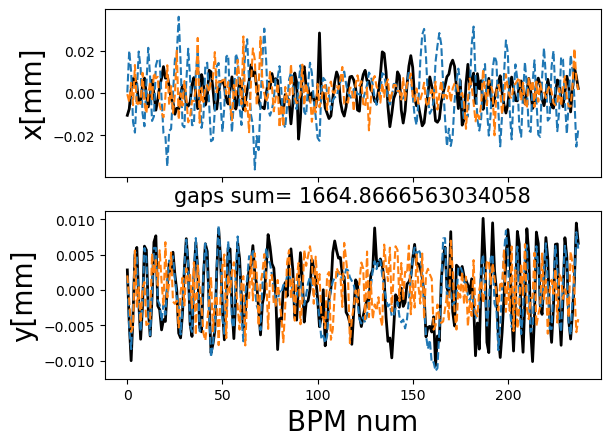

<Figure size 700x1000 with 0 Axes>

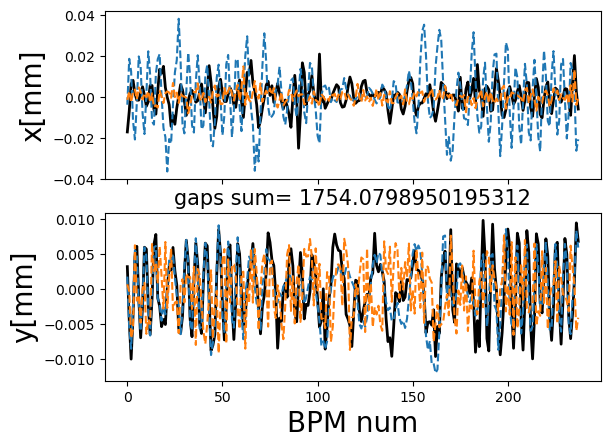

<Figure size 700x1000 with 0 Axes>

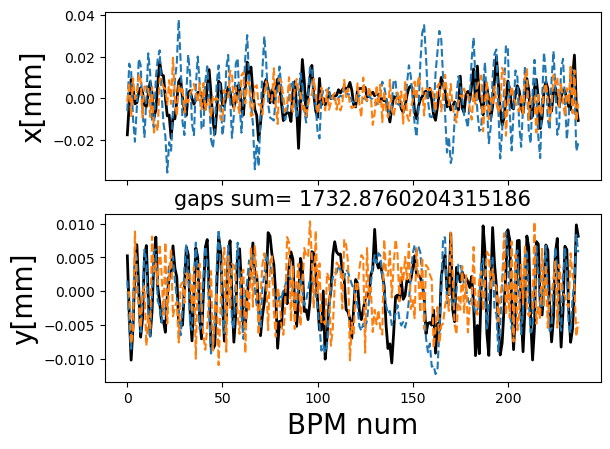

<Figure size 700x1000 with 0 Axes>

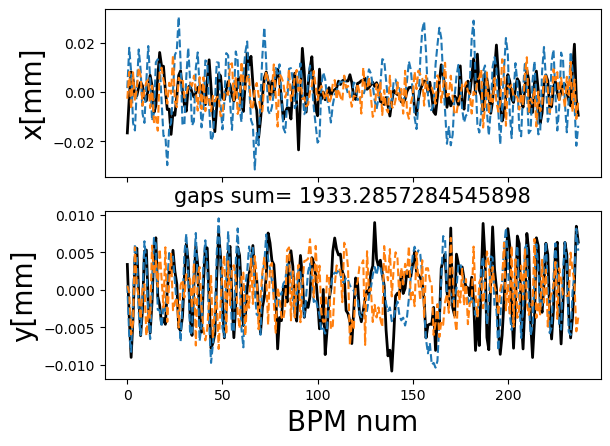

<Figure size 700x1000 with 0 Axes>

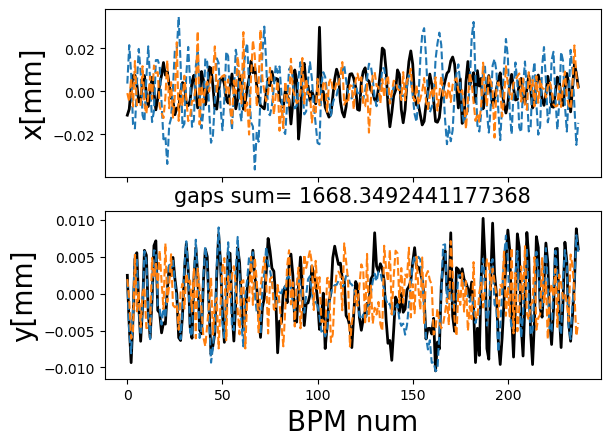

<Figure size 700x1000 with 0 Axes>

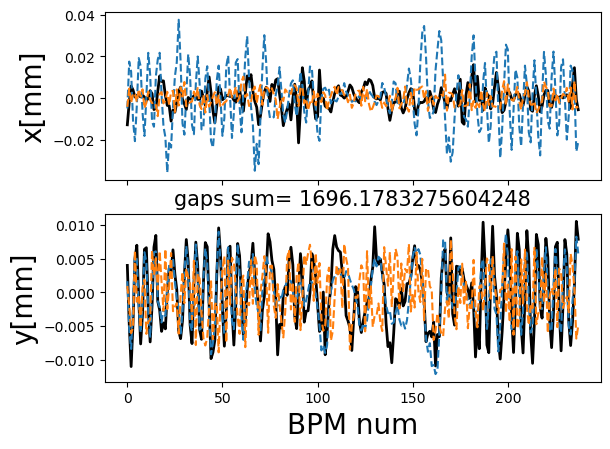

<Figure size 700x1000 with 0 Axes>

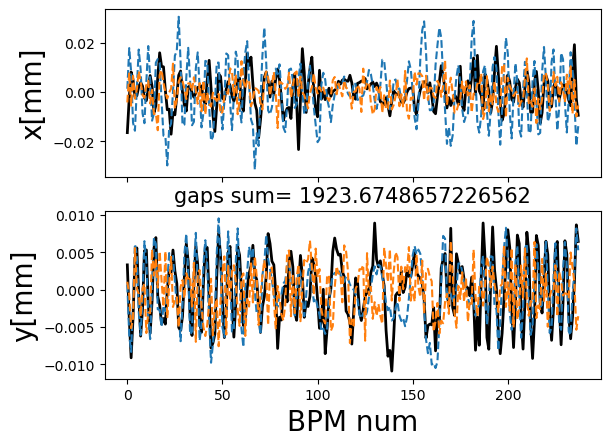

<Figure size 700x1000 with 0 Axes>

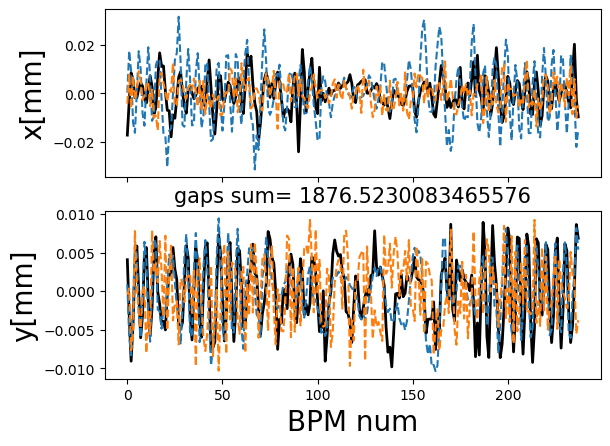

<Figure size 700x1000 with 0 Axes>

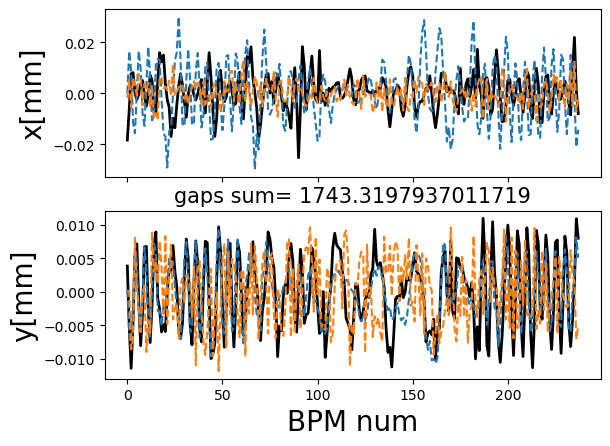

<Figure size 700x1000 with 0 Axes>

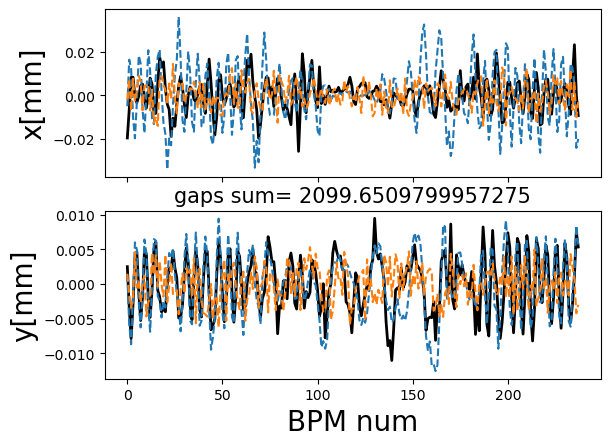

<Figure size 700x1000 with 0 Axes>

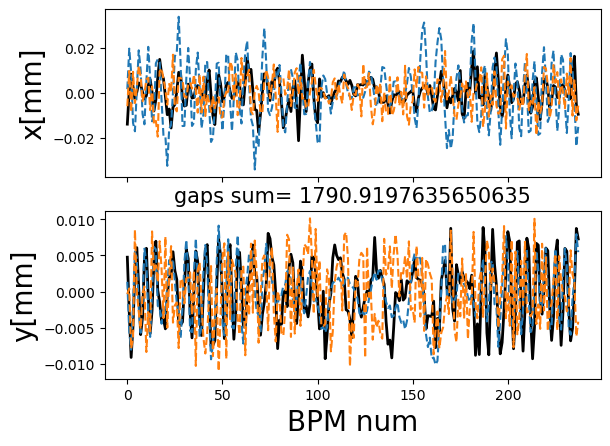

<Figure size 700x1000 with 0 Axes>

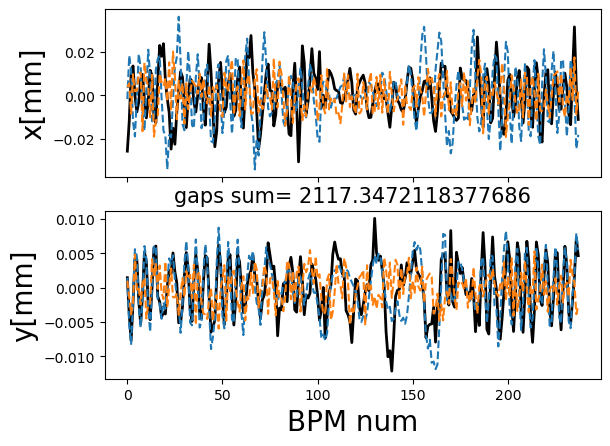

<Figure size 700x1000 with 0 Axes>

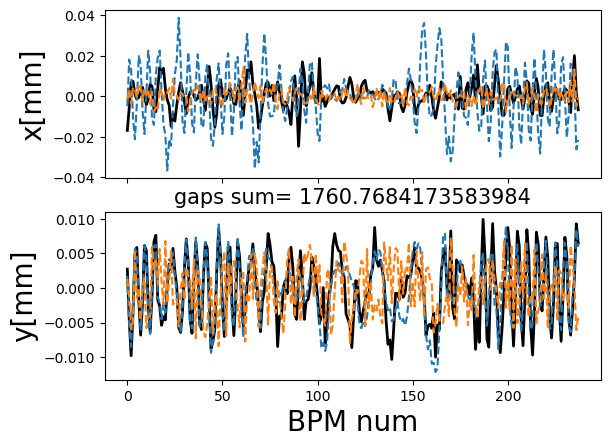

<Figure size 700x1000 with 0 Axes>

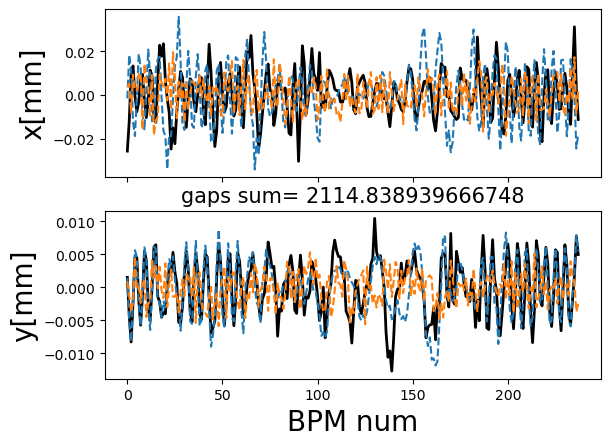

<Figure size 700x1000 with 0 Axes>

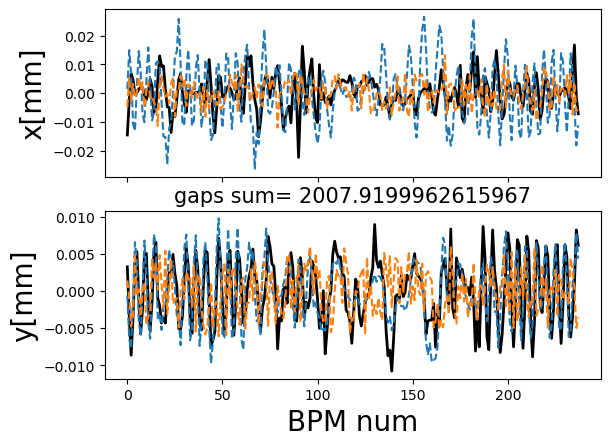

<Figure size 700x1000 with 0 Axes>

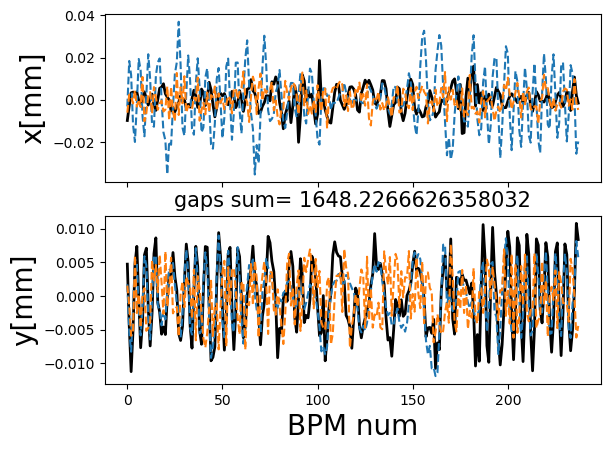

<Figure size 700x1000 with 0 Axes>

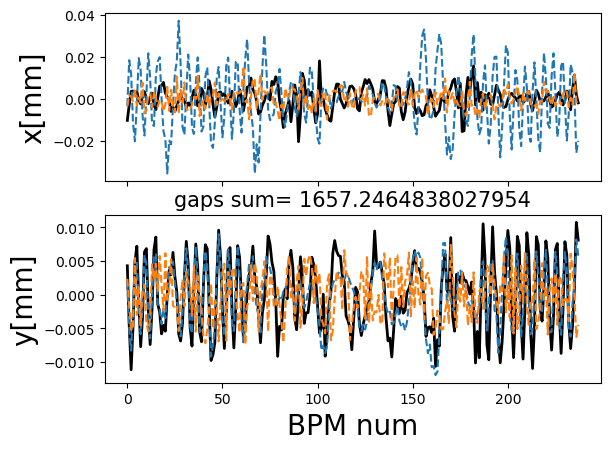

<Figure size 700x1000 with 0 Axes>

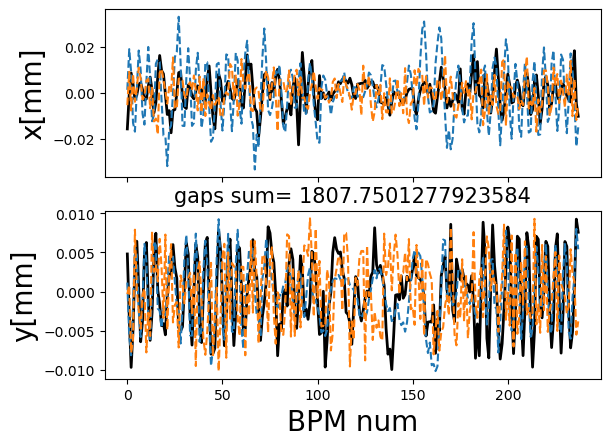

<Figure size 700x1000 with 0 Axes>

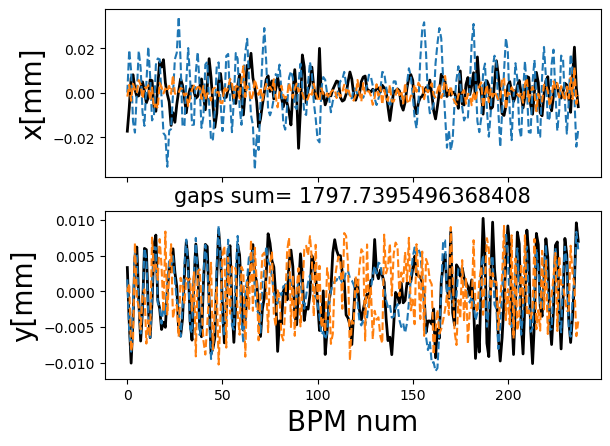

<Figure size 700x1000 with 0 Axes>

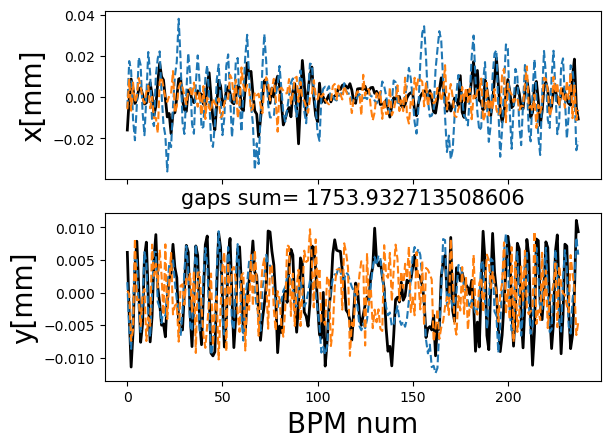

In [86]:
for i in np.random.choice(len(x_try),20):
    fig=plt.figure(figsize=(7,10))
    _,(ax1,ax2)= plt.subplots(2,sharex='col')
    #ax1.plot(y_test[i,:238],c='k',linewidth=2)
    ax1.plot(y_try[i,:238]*1e-7,c='k',linewidth=2)
    #ax1.plot(x_mes[i]*1e-5,c='k',linewidth=2)
    #ax1.plot(y_outRNN[i,:238],linestyle='--')
    #ax1.plot(y_outRNN3[i,:238],linestyle='--')
    ax1.plot(y_outRNN2[i,:238],linestyle='--')
    ax1.plot(A[i]*0.1,linestyle='--')

    #ax1.set_xlabel('BPM num',fontsize=20)
    #ax1.title.set_text(x_try[i])
    ax1.set_ylabel('x[mm]',fontsize=20)
    #ax1.set_xlim(0,200)
    #ax1.set_ylim(-0.1,0.1)
    #ax1.set_title("Horizontal",fontsize=20)

    ax2.set_title('gaps sum= '+str(sum(x_try[i])),fontsize=15)
    #ax2.plot(z[i,238:],c='k',linewidth=2.5)
    ax2.plot(y_try[i,238:]*1e-7,c='k',linewidth=2)
    #ax2.plot(y_mes[i]*1e-6,c='k',linewidth=2)
    #ax2.plot(y_outRNN[i,238:]*1,linestyle='--')
    #ax2.plot(y_outRNN3[i,238:],linestyle='--')
    ax2.plot(y_outRNN2[i,238:],linestyle='--')
    ax2.plot(B[i]*0.1,linestyle='--')

    #ax2.set_xlim(0,200)
    #ax2.set_ylim(-0.1,0.1)
    ax2.set_xlabel('BPM num',fontsize=20)
    ax2.set_ylabel('y[mm]',fontsize=20)

In [56]:
len(x_try)
#set up a matrix containing the gap of 1 closed ID and max gap of all the other in each line for 24 and vertically sum the predicted orbit. repeat for each line of x_try 

302

In [47]:
maxs=df_train[gap_tr].max(axis=0)

In [52]:
np.array(maxs)

array([217.01116943, 217.01011658, 217.00215149, 217.00357056,
       147.00045776, 147.00045776, 217.00073242, 217.00267029,
        39.0015564 , 215.00660706, 217.0027771 , 217.00248718,
       217.00172424, 217.00192261, 217.00914001, 217.00582886,
       217.00094604,  39.00143051, 217.00585938, 217.00212097,
       217.00378418, 220.00210571, 220.00003052, 217.00041199])

In [62]:
test_arr=np.array([[0,1,0],[1,0,0]])
test_arr

array([[0, 1, 0],
       [1, 0, 0]])

In [65]:
test_arr.sum(axis=0)

array([1, 1, 0])

In [60]:
y_try.shape

(302, 476)

In [71]:
lin_sum=np.empty(y_try.shape)
for i in range(len(x_try)):
    ab=np.empty((24,476))
    for j in range(24):
        a=np.array(maxs)
        a[j]=x_try[i,j]
        a_scaled = x_scaler.transform(a.reshape(1, -1))
        ab_y_scaled=modelRNN2.predict(a_scaled)
        ab[j,:]=y_scaler.inverse_transform(ab_y_scaled)
    lin_sum[i,:]=ab.sum(axis=0)


1/1 [==============================] - 0s 23ms/step


C:\Users\veglia\AppData\Local\Temp\ipykernel_21792\392510497.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize=(7,10))


<Figure size 700x1000 with 0 Axes>

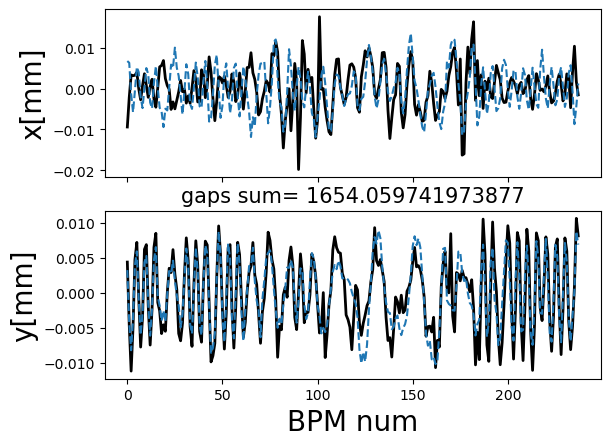

<Figure size 700x1000 with 0 Axes>

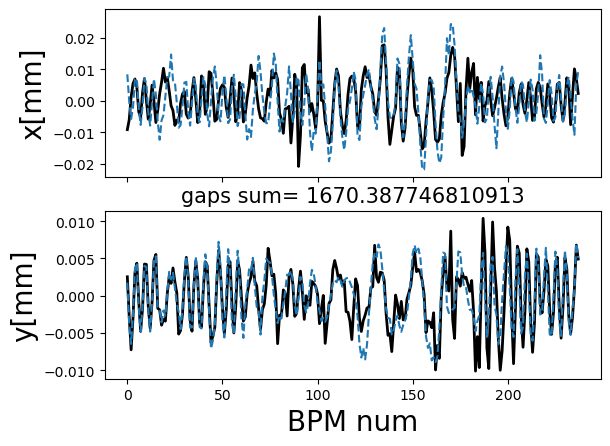

<Figure size 700x1000 with 0 Axes>

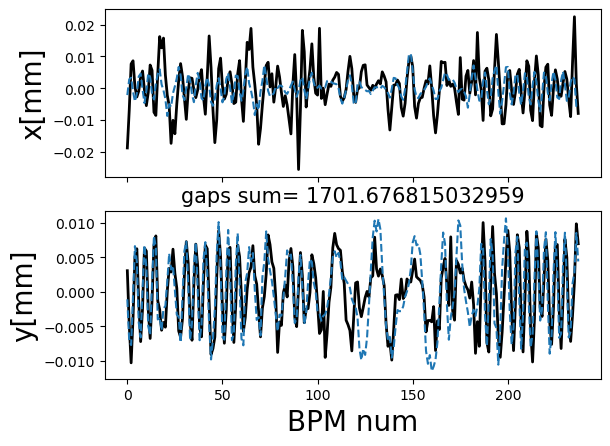

<Figure size 700x1000 with 0 Axes>

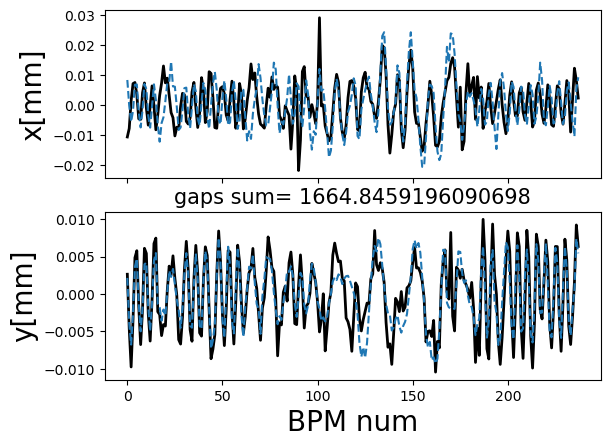

<Figure size 700x1000 with 0 Axes>

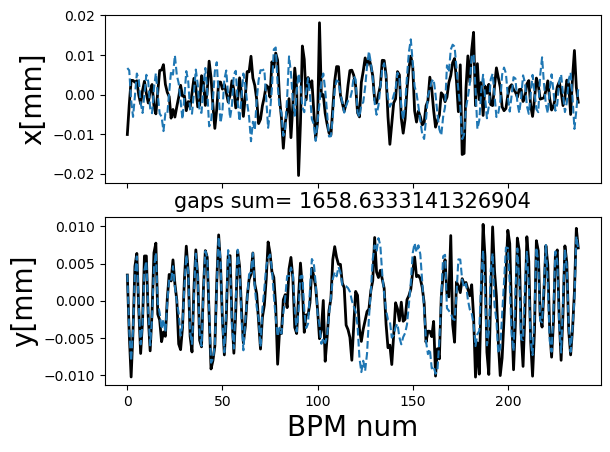

<Figure size 700x1000 with 0 Axes>

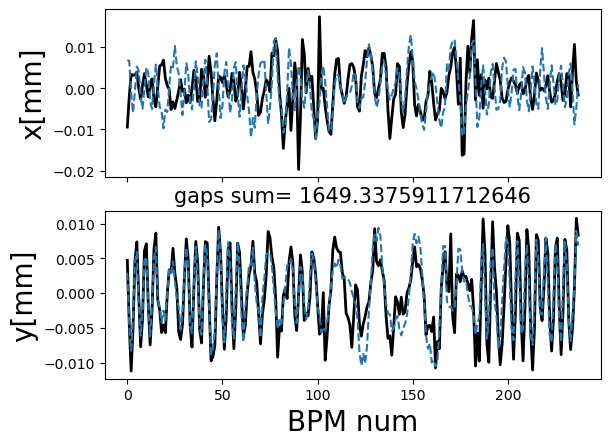

<Figure size 700x1000 with 0 Axes>

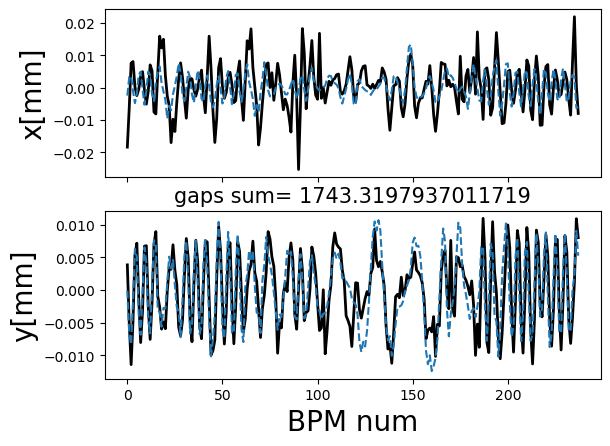

<Figure size 700x1000 with 0 Axes>

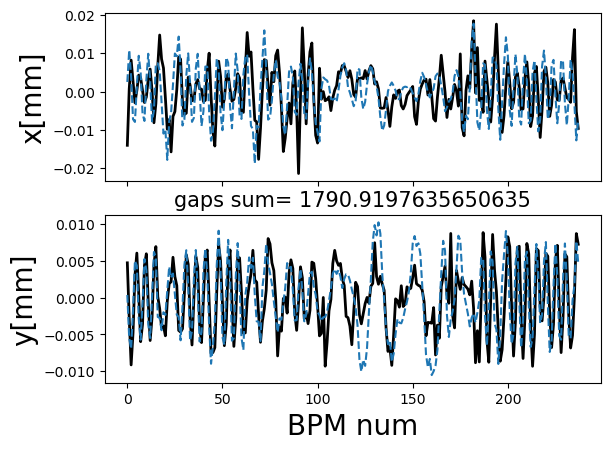

<Figure size 700x1000 with 0 Axes>

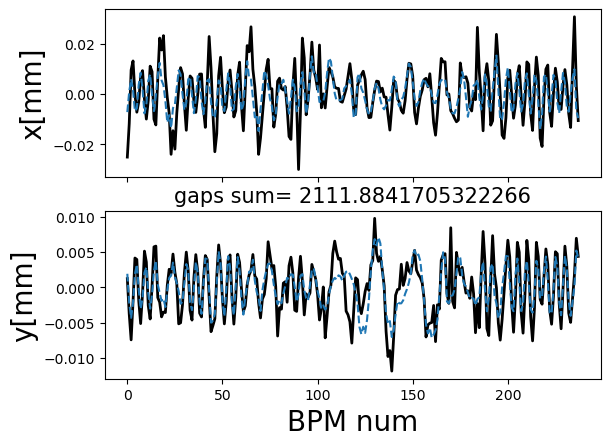

<Figure size 700x1000 with 0 Axes>

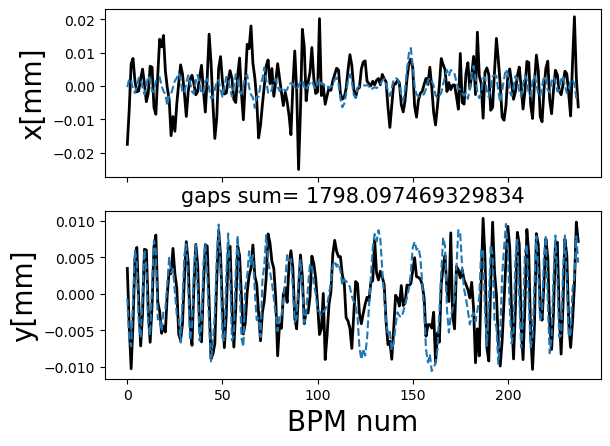

<Figure size 700x1000 with 0 Axes>

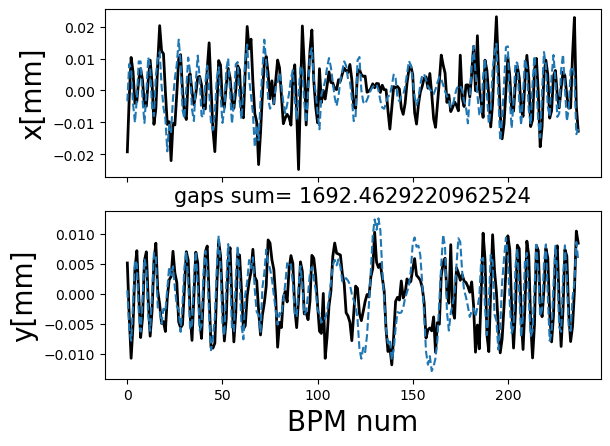

<Figure size 700x1000 with 0 Axes>

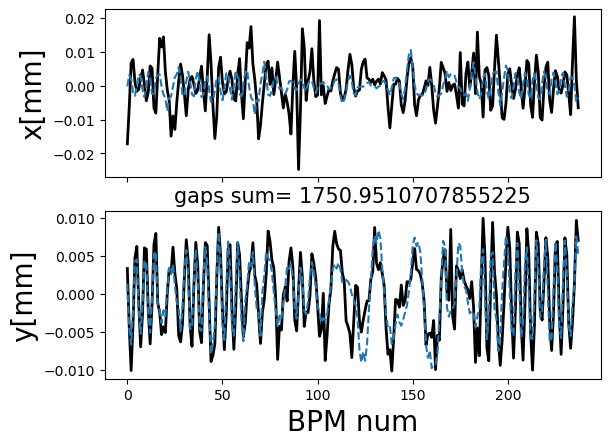

<Figure size 700x1000 with 0 Axes>

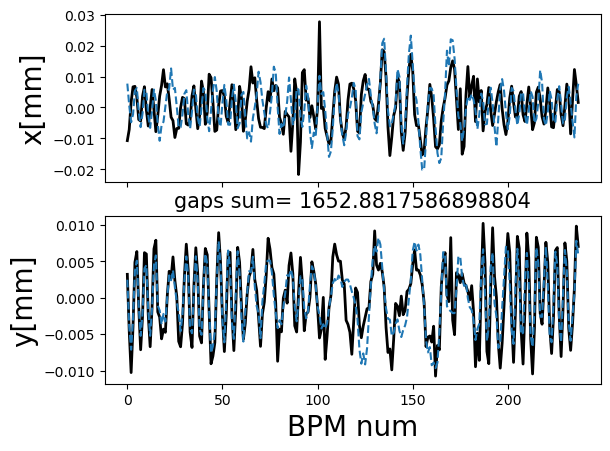

<Figure size 700x1000 with 0 Axes>

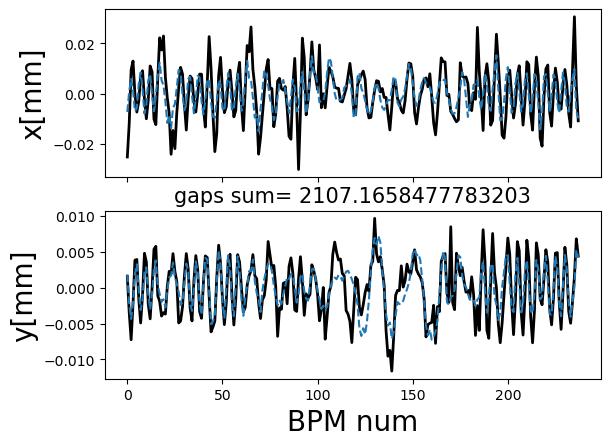

<Figure size 700x1000 with 0 Axes>

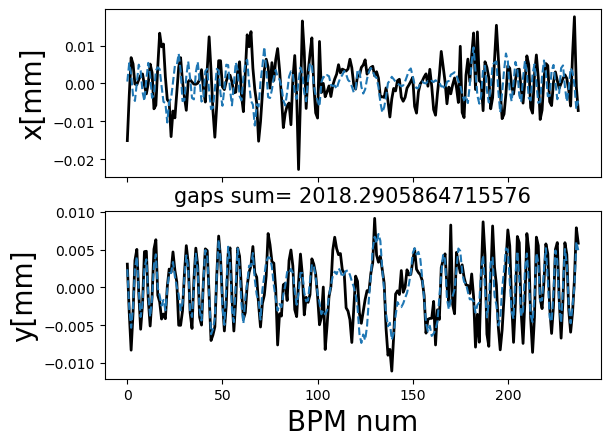

<Figure size 700x1000 with 0 Axes>

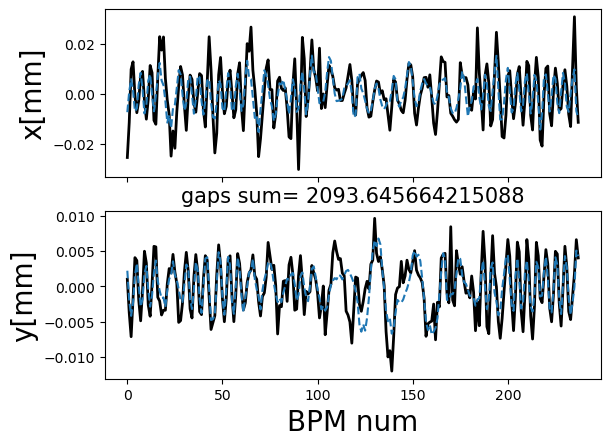

<Figure size 700x1000 with 0 Axes>

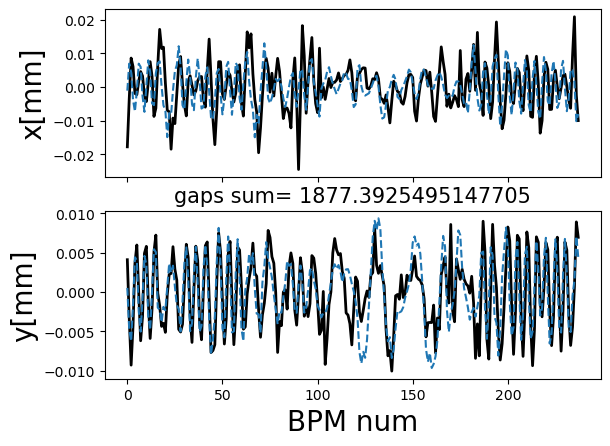

<Figure size 700x1000 with 0 Axes>

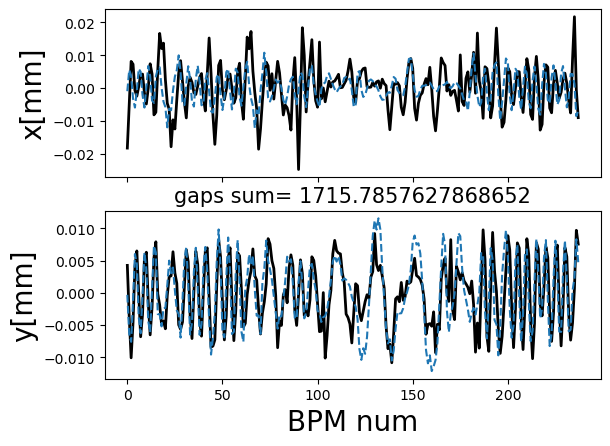

<Figure size 700x1000 with 0 Axes>

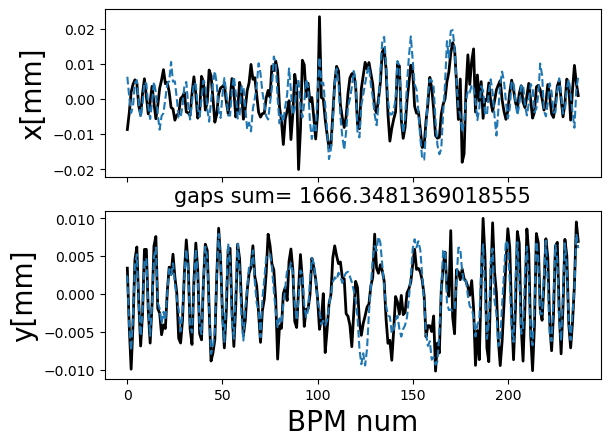

<Figure size 700x1000 with 0 Axes>

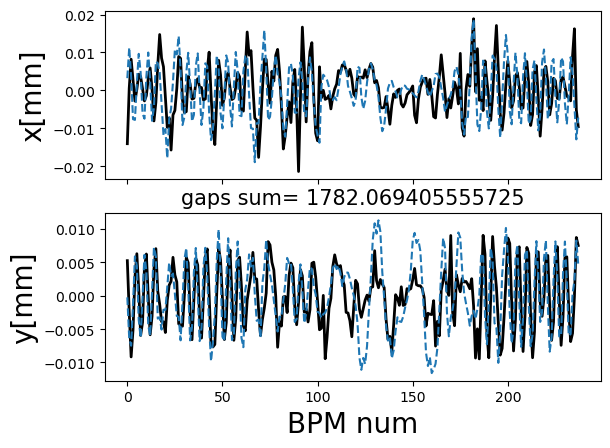

In [77]:
for i in np.random.choice(len(x_try),20):
    fig=plt.figure(figsize=(7,10))
    _,(ax1,ax2)= plt.subplots(2,sharex='col')
    #ax1.plot(y_test[i,:238],c='k',linewidth=2)
    ax1.plot(y_try[i,:238]*1e-7,c='k',linewidth=2)
    #ax1.plot(x_mes[i]*1e-5,c='k',linewidth=2)
    #ax1.plot(y_outRNN[i,:238],linestyle='--')
    #ax1.plot(y_outRNN3[i,:238],linestyle='--')
    #ax1.plot(y_outRNN2[i,:238],linestyle='--')
    #ax1.plot(A[i]*0.1,linestyle='--')
    ax1.plot(lin_sum[i,:238]*0.1,linestyle='--')

    #ax1.set_xlabel('BPM num',fontsize=20)
    #ax1.title.set_text(x_try[i])
    ax1.set_ylabel('x[mm]',fontsize=20)
    #ax1.set_xlim(0,200)
    #ax1.set_ylim(-0.1,0.1)
    #ax1.set_title("Horizontal",fontsize=20)

    ax2.set_title('gaps sum= '+str(sum(x_try[i])),fontsize=15)
    #ax2.plot(z[i,238:],c='k',linewidth=2.5)
    ax2.plot(y_try[i,238:]*1e-7,c='k',linewidth=2)
    #ax2.plot(y_mes[i]*1e-6,c='k',linewidth=2)
    #ax2.plot(y_outRNN[i,238:]*1,linestyle='--')
    #ax2.plot(y_outRNN3[i,238:],linestyle='--')
    #ax2.plot(y_outRNN2[i,238:],linestyle='--')
    #ax2.plot(B[i]*0.1,linestyle='--')
    ax2.plot(lin_sum[i,238:]*0.1,linestyle='--')

    #ax2.set_xlim(0,200)
    #ax2.set_ylim(-0.1,0.1)
    ax2.set_xlabel('BPM num',fontsize=20)
    ax2.set_ylabel('y[mm]',fontsize=20)

In [96]:
#append the values to the matrix used to train and train again

x_more_train=np.vstack((x_in,df[gap].to_numpy()))
z_more_train=np.vstack((z,y_try))

In [88]:
#train the RNN with this new data
x_train,x_test,y_train,y_test = train_test_split(x_more_train, z_more_train, test_size=0.2, shuffle=True)
# Normalisation
x_scaler = StandardScaler()
x_train_scaled = x_scaler.fit_transform(x_train)
x_test_scaled = x_scaler.transform(x_test)

y_scaler = StandardScaler()
y_train_scaled = y_scaler.fit_transform(y_train)
y_test_scaled = y_scaler.transform(y_test)

x_train_scaled = np.expand_dims(x_train_scaled, axis = -1)
x_test_scaled= np.expand_dims(x_test_scaled, axis = -1) 

15487

In [97]:

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from keras.utils import np_utils
from keras.callbacks import TensorBoard, EarlyStopping
import seaborn as sns
from keras.layers import Dropout

In [98]:
model = keras.Sequential()
model.add(layers.SimpleRNN(128,batch_input_shape=(None, 24,1),return_sequences=True))
model.add(layers.SimpleRNN(256,return_sequences=True))
model.add(layers.SimpleRNN(128,return_sequences=True))
model.add(layers.SimpleRNN(128,return_sequences=False))
model.add(layers.Dense(476))
model.summary()
model.compile(loss="mse", optimizer="adam", metrics=["mae"])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 24, 128)           16640     
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 24, 256)           98560     
                                                                 
 simple_rnn_2 (SimpleRNN)    (None, 24, 128)           49280     
                                                                 
 simple_rnn_3 (SimpleRNN)    (None, 128)               32896     
                                                                 
 dense (Dense)               (None, 476)               61404     
                                                                 
Total params: 258,780
Trainable params: 258,780
Non-trainable params: 0
_________________________________________________________________


In [99]:
history = model.fit(
    x_train_scaled,
    y_train_scaled,
    batch_size=250,
    epochs=300,
    validation_data=(x_test_scaled,y_test_scaled),
    #callbacks=[WandbCallback()]
)

Epoch 1/300
56/56 [==============================] - 10s 130ms/step - loss: 0.5945 - mae: 0.4645 - val_loss: 0.2661 - val_mae: 0.3172
Epoch 2/300
56/56 [==============================] - 6s 111ms/step - loss: 0.2180 - mae: 0.2930 - val_loss: 0.1855 - val_mae: 0.2721
Epoch 3/300
56/56 [==============================] - 6s 109ms/step - loss: 0.1721 - mae: 0.2627 - val_loss: 0.1512 - val_mae: 0.2440
Epoch 4/300
56/56 [==============================] - 6s 110ms/step - loss: 0.1400 - mae: 0.2358 - val_loss: 0.1924 - val_mae: 0.2928
Epoch 5/300
56/56 [==============================] - 6s 111ms/step - loss: 0.1369 - mae: 0.2346 - val_loss: 0.1542 - val_mae: 0.2623
Epoch 6/300
56/56 [==============================] - 4s 79ms/step - loss: 0.1235 - mae: 0.2228 - val_loss: 0.1195 - val_mae: 0.2166
Epoch 7/300
56/56 [==============================] - 4s 69ms/step - loss: 0.1240 - mae: 0.2235 - val_loss: 0.1536 - val_mae: 0.2611
Epoch 8/300
56/56 [==============================] - 4s 69ms/step - lo

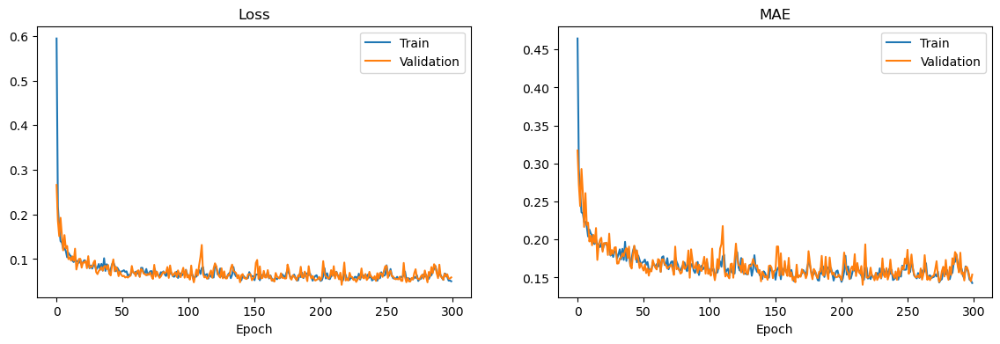

In [100]:
plt.figure(figsize=(14,4))
plt.subplot(1, 2, 1)
plt.title("Loss")
plt.plot(history.history["loss"], label="Train")
plt.plot(history.history["val_loss"], label="Validation")
plt.xlabel("Epoch")
plt.legend()
plt.subplot(1, 2, 2)
plt.title("MAE")
plt.plot(history.history["mae"], label="Train")
plt.plot(history.history["val_mae"], label="Validation")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [101]:
path='New_RNN_model_gap2orbit_24_multiple.pt'
model.save(path)

INFO:tensorflow:Assets written to: New_RNN_model_gap2orbit_24_multiple.pt\assets


In [103]:
df_new=pd.read_pickle('data/gap_orbit_OCT23_123234.pkl')

x_new = df_new.columns[df_new.columns.str.endswith('_x')]
y_new= df_new.columns[df_new.columns.str.endswith('_y')]

bpms_tr=df_train.columns[df_train.columns.str.startswith('BPM')]
bpms   =df_new.columns[df_new.columns.str.startswith('BPM')]

to_drop=list(set(bpms)-set(bpms_tr))
print(to_drop)
df_new=df_new.drop(columns=to_drop)
x_new = df_new.columns[df_new.columns.str.endswith('_x')]
y_new = df_new.columns[df_new.columns.str.endswith('_y')]

x_mes_new=df_new[x_new].to_numpy()
y_mes_new=df_new[y_new].to_numpy()
print(x_mes_new.shape)
print(y_mes_new.shape)

df_new.insert(4,'PU04p',147.00)
gap_new = df_new.columns[df.columns.str.startswith('PU')]

x_try_new=x_more_train#df_new[gap_new].to_numpy()
x_try_scaled_new = x_scaler.transform(x_try_new)

y_scaled_new=model.predict(x_try_scaled_new)
y_out_new=y_scaler.inverse_transform(y_scaled_new)

['BPM_OL_98_y', 'BPM_SWL_31_y', 'BPM_NOR_98_x', 'BPM_NOR_98_y', 'BPM_SOL_24_x', 'BPM_OL_98_x', 'BPM_SOL_24_y', 'BPM_SOR_67_y', 'BPM_NR_19_x', 'BPM_OL_144_x', 'BPM_OR_17_x', 'BPM_OL_75_x', 'BPM_NOR_52_x', 'BPM_SOR_67_x', 'BPM_NR_19_y', 'BPM_NOR_52_y', 'BPM_OL_75_y', 'BPM_OL_144_y', 'BPM_OR_17_y', 'BPM_SWL_31_x']
(188, 238)
(188, 238)
6/6 [==============================] - 0s 7ms/step


In [112]:
x_try_new=x_test#df_new[gap_new].to_numpy()
x_try_scaled_new = x_scaler.transform(x_try_new)

y_scaled_new=model.predict(x_try_scaled_new)
y_out_new=y_scaler.inverse_transform(y_scaled_new)

49/49 [==============================] - 0s 8ms/step


C:\Users\veglia\AppData\Local\Temp\ipykernel_23852\288123429.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize=(7,10))


<Figure size 700x1000 with 0 Axes>

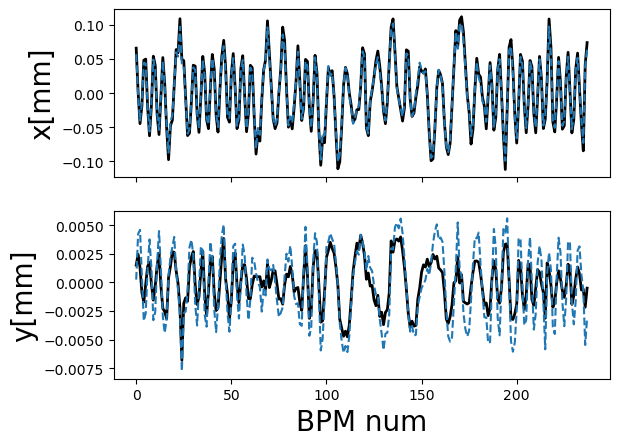

<Figure size 700x1000 with 0 Axes>

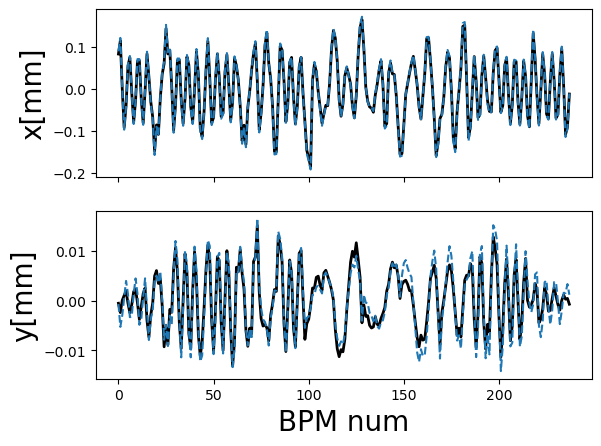

<Figure size 700x1000 with 0 Axes>

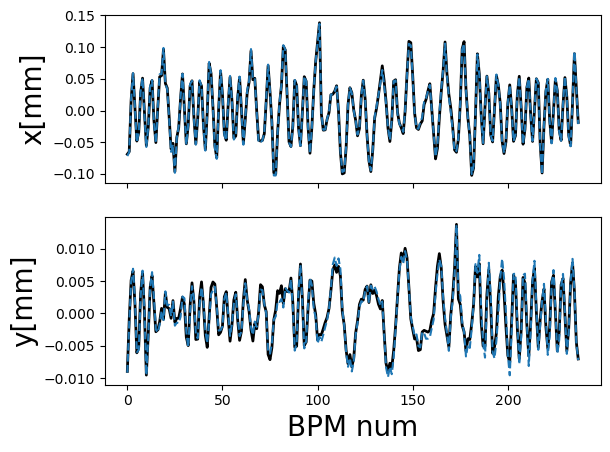

<Figure size 700x1000 with 0 Axes>

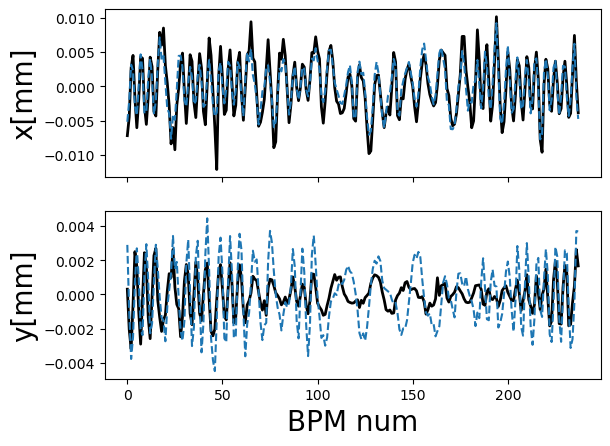

<Figure size 700x1000 with 0 Axes>

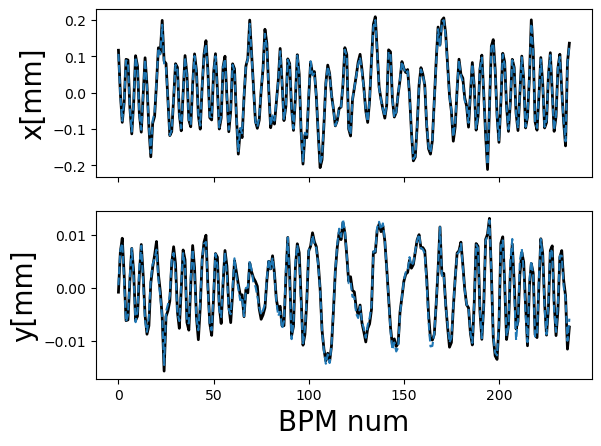

<Figure size 700x1000 with 0 Axes>

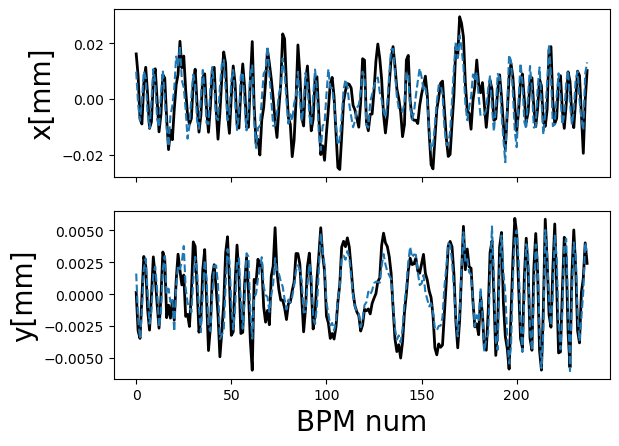

<Figure size 700x1000 with 0 Axes>

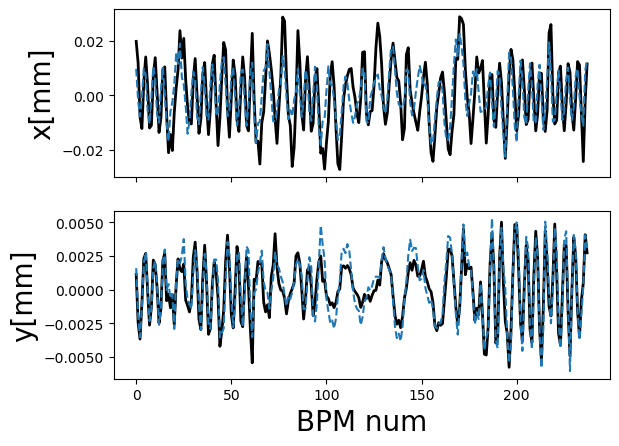

<Figure size 700x1000 with 0 Axes>

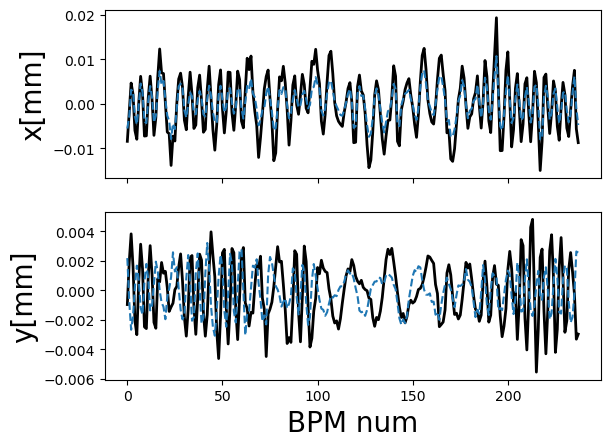

<Figure size 700x1000 with 0 Axes>

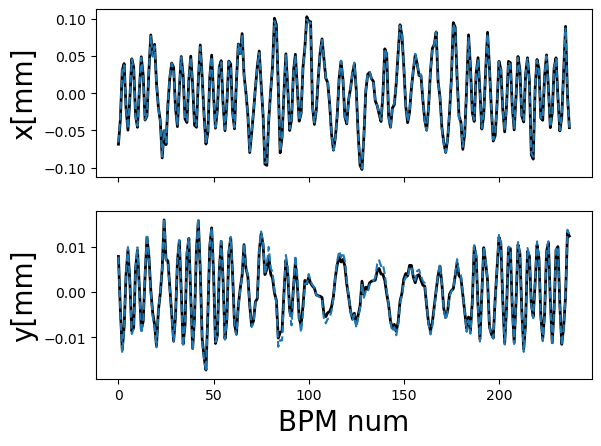

<Figure size 700x1000 with 0 Axes>

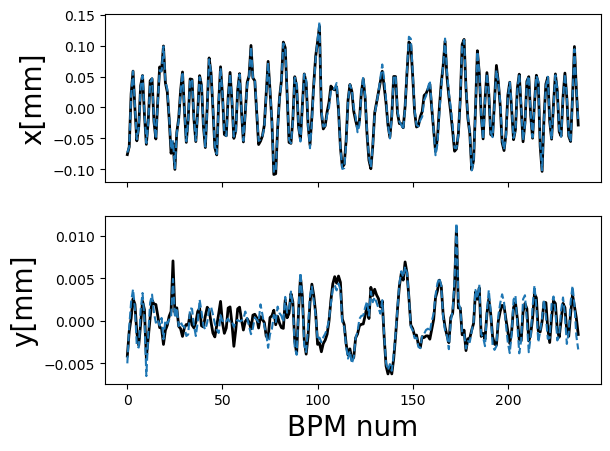

<Figure size 700x1000 with 0 Axes>

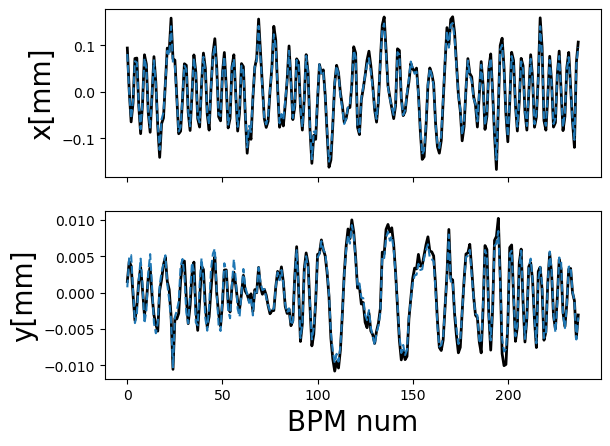

<Figure size 700x1000 with 0 Axes>

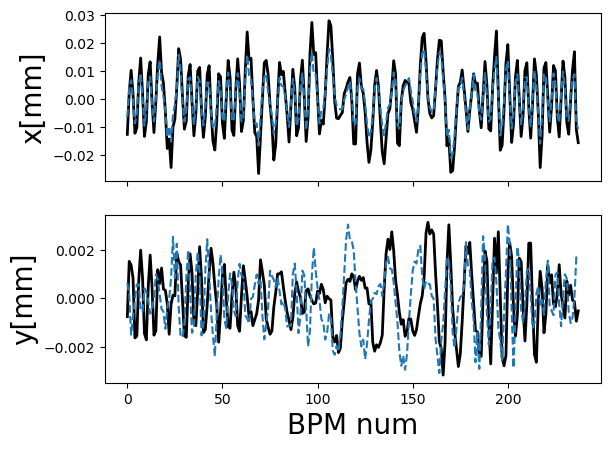

<Figure size 700x1000 with 0 Axes>

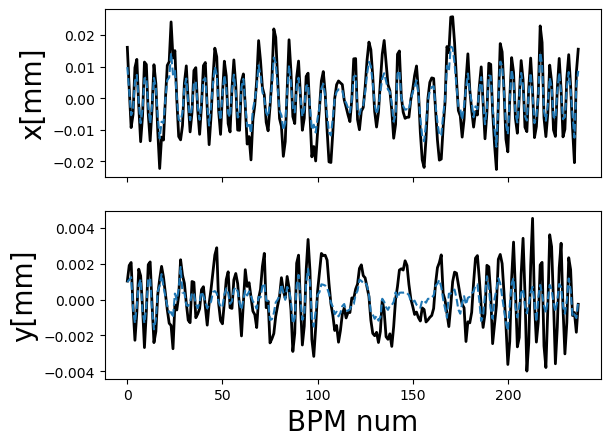

<Figure size 700x1000 with 0 Axes>

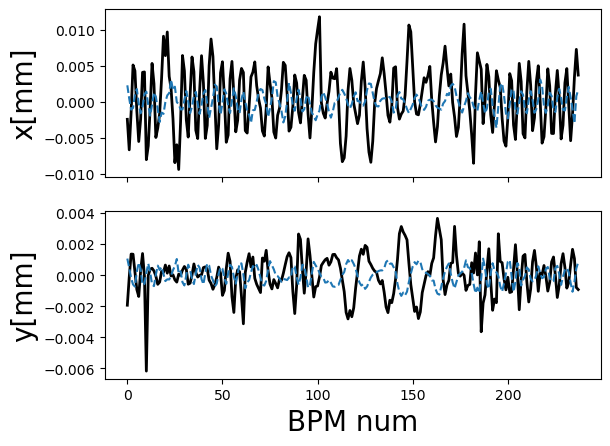

<Figure size 700x1000 with 0 Axes>

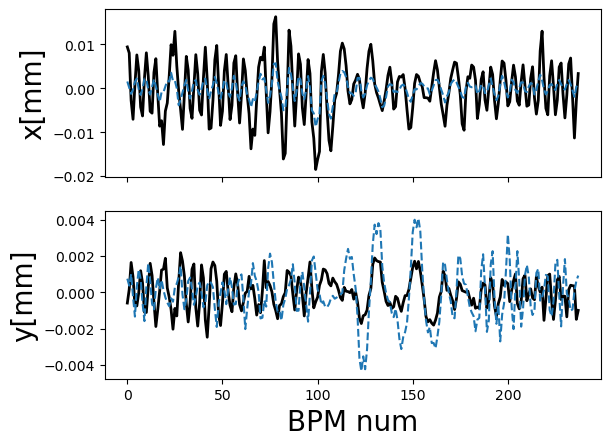

<Figure size 700x1000 with 0 Axes>

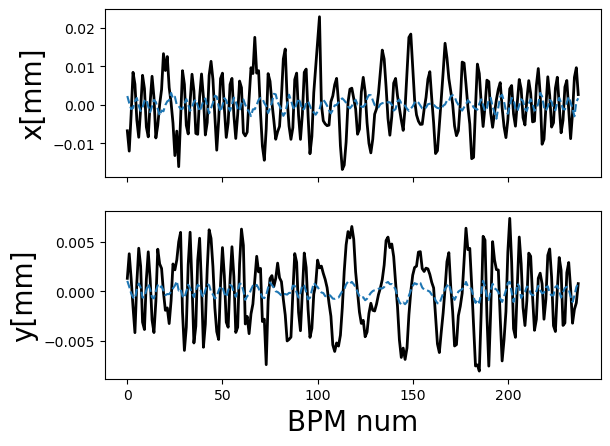

<Figure size 700x1000 with 0 Axes>

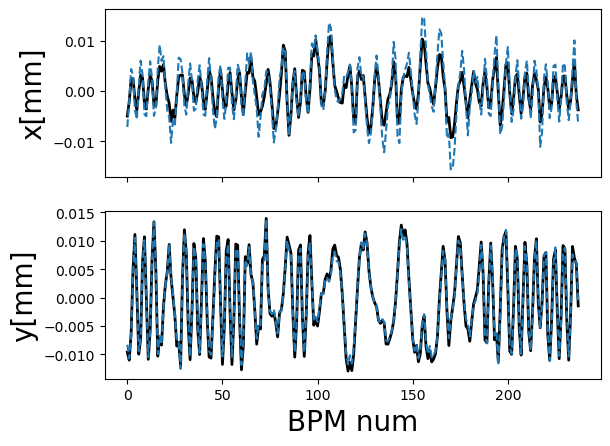

<Figure size 700x1000 with 0 Axes>

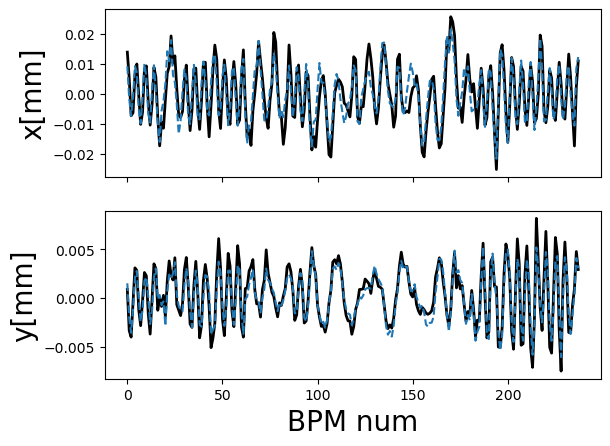

<Figure size 700x1000 with 0 Axes>

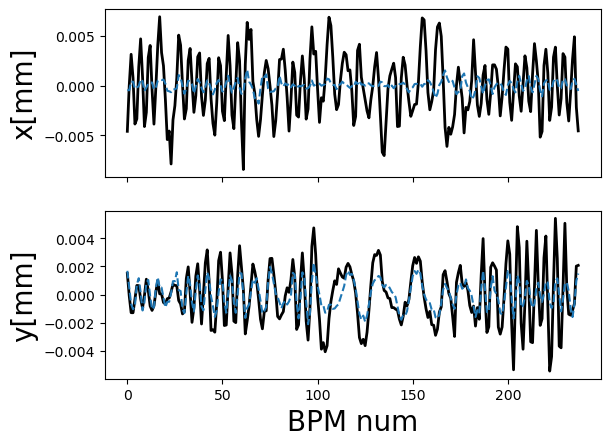

<Figure size 700x1000 with 0 Axes>

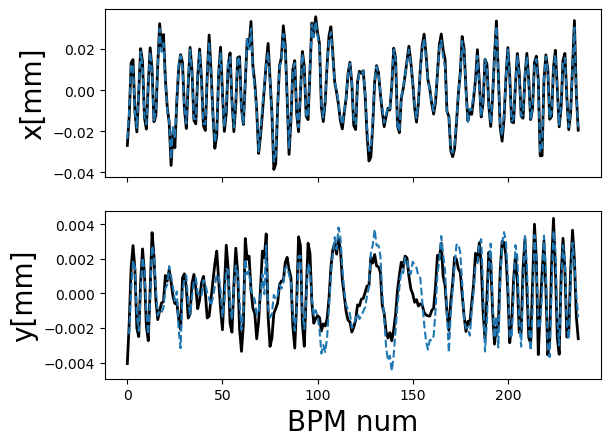

In [116]:
for i in np.random.choice(len(x_test),20):
    fig=plt.figure(figsize=(7,10))
    _,(ax1,ax2)= plt.subplots(2,sharex='col')
    ax1.plot(y_test[i,:238],c='k',linewidth=2)
    #ax1.plot(x_mes_new[i]*1e-8,c='k',linewidth=2)
    ax1.plot(y_out_new[i,:238],linestyle='--')
    #ax1.plot(y_outRNN3[i,:238],linestyle='--')
    #ax1.plot(y_outRNN2[i,:238],linestyle='--')
    #ax1.plot(A[i]*0.1,linestyle='--')
    #ax1.plot(lin_sum[i,:238]*0.1,linestyle='--')

    #ax1.set_xlabel('BPM num',fontsize=20)
    #ax1.title.set_text(x_try[i])
    ax1.set_ylabel('x[mm]',fontsize=20)
    #ax1.set_xlim(0,200)
    #ax1.set_ylim(-0.1,0.1)
    #ax1.set_title("Horizontal",fontsize=20)

    #ax2.set_title('gaps sum= '+str(sum(x_try[i])),fontsize=15)
    #ax2.plot(z[i,238:],c='k',linewidth=2.5)
    ax2.plot(y_test[i,238:],c='k',linewidth=2)
    #ax2.plot(y_mes_new[i]*1e-8,c='k',linewidth=2)
    ax2.plot(y_out_new[i,238:]*1,linestyle='--')
    #ax2.plot(y_outRNN3[i,238:],linestyle='--')
    #ax2.plot(y_outRNN2[i,238:],linestyle='--')
    #ax2.plot(B[i]*0.1,linestyle='--')
    #ax2.plot(lin_sum[i,238:]*0.1,linestyle='--')

    #ax2.set_xlim(0,200)
    #ax2.set_ylim(-0.1,0.1)
    ax2.set_xlabel('BPM num',fontsize=20)
    ax2.set_ylabel('y[mm]',fontsize=20)

In [121]:
df_jun=pd.read_pickle('data/NEW_ID_gap_vs_orbit/gap_orbit_NEW_160252.pkl')
gap_jun = df_jun.columns[df_jun.columns.str.startswith('PU')]

x_jun = df_jun.columns[df_jun.columns.str.endswith('_x')]
y_jun = df_jun.columns[df_jun.columns.str.endswith('_y')]

bpms_jun = df_jun.columns[df_jun.columns.str.startswith('BPM')]


file_op_jun=pd.read_csv('data/temp2023-06-21T16_43_45+02.csv',delimiter=', ')

titl=file_op_jun[file_op_jun['TINE/DOOCS address'].str.startswith(str_bpm)]['TINE/DOOCS address']
val=file_op_jun[file_op_jun['TINE/DOOCS address'].str.startswith(str_bpm)]['file value']

tit=titl.to_numpy()
ti_x=[str(tit[i].split('/')[2])+'_x' for i in range(int(len(tit)/2))]
ti_y=[str(tit[i].split('/')[2])+'_y' for i in range(int(len(tit)/2))]
ti=np.hstack((ti_x,ti_y))

valx=[float(val.iloc[i]) for i in range(int(len(tit)/2))]
valy=[float(val.iloc[i+int(len(tit)/2)]) for i in range(int(len(tit)/2))]


valxy=[]
for i in valx:
    valxy.append(i)
for j in valy:
    valxy.append(j)


df_op_jun=pd.DataFrame(data=[valxy],columns=ti)

to_drop2=list(set(ti)-set(bpms_tr))

df_op_jun=df_op_jun.drop(columns=to_drop2)
df_jun=df_jun.drop(columns=to_drop2)
x_jun = df_jun.columns[df_jun.columns.str.endswith('_x')]
y_jun = df_jun.columns[df_jun.columns.str.endswith('_y')]
x_op_jun=df_op_jun.columns[df_op_jun.columns.str.endswith('_x')]
y_op_jun=df_op_jun.columns[df_op_jun.columns.str.endswith('_y')]

df_jun[x_jun]=df_jun[x_jun]-np.array(df_op_jun[x_op_jun])
df_jun[y_jun]=df_jun[y_jun]-np.array(df_op_jun[y_op_jun])

x_mes_jun=df_jun[x_jun].to_numpy()
y_mes_jun=df_jun[y_jun].to_numpy()


C:\Users\veglia\AppData\Local\Temp\ipykernel_23852\2746165034.py:10: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  file_op_jun=pd.read_csv('data/temp2023-06-21T16_43_45+02.csv',delimiter=', ')


In [128]:
df_jun.insert(4,'PU04p',147.00)
gap_jun = df_jun.columns[df_jun.columns.str.startswith('PU')]

In [129]:
x_more_train=np.vstack((x_more_train,df_jun[gap_jun].to_numpy()))
z_more_train=np.vstack((z_more_train,np.hstack((x_mes_jun,y_mes_jun))))

In [137]:
#train the RNN with this new data
x_train,x_test,y_train,y_test = train_test_split(x_more_train, z_more_train, test_size=0.2, shuffle=True)#df_jun[gap_jun].to_numpy()
# Normalisation
x_scaler = StandardScaler()
x_train_scaled = x_scaler.fit_transform(x_train)
x_test_scaled = x_scaler.transform(x_test)

y_scaler = StandardScaler()
y_train_scaled = y_scaler.fit_transform(y_train)
y_test_scaled = y_scaler.transform(y_test)

x_train_scaled = np.expand_dims(x_train_scaled, axis = -1)
x_test_scaled= np.expand_dims(x_test_scaled, axis = -1) 

In [138]:
model1 = keras.Sequential()
model1.add(layers.SimpleRNN(128,batch_input_shape=(None, 24,1),return_sequences=True))
model1.add(layers.SimpleRNN(256,return_sequences=True))
model1.add(layers.SimpleRNN(128,return_sequences=True))
model1.add(layers.SimpleRNN(128,return_sequences=False))
model1.add(layers.Dense(476))
model1.summary()
model1.compile(loss="mse", optimizer="adam", metrics=["mae"])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_4 (SimpleRNN)    (None, 24, 128)           16640     
                                                                 
 simple_rnn_5 (SimpleRNN)    (None, 24, 256)           98560     
                                                                 
 simple_rnn_6 (SimpleRNN)    (None, 24, 128)           49280     
                                                                 
 simple_rnn_7 (SimpleRNN)    (None, 128)               32896     
                                                                 
 dense_1 (Dense)             (None, 476)               61404     
                                                                 
Total params: 258,780
Trainable params: 258,780
Non-trainable params: 0
_________________________________________________________________


In [139]:
history = model1.fit(
    x_train_scaled,
    y_train_scaled,
    batch_size=250,
    epochs=350,
    validation_data=(x_test_scaled,y_test_scaled),
    #callbacks=[WandbCallback()]
)

Epoch 1/350
56/56 [==============================] - 7s 81ms/step - loss: 0.5131 - mae: 0.2824 - val_loss: 0.2405 - val_mae: 0.1292
Epoch 2/350
56/56 [==============================] - 8s 136ms/step - loss: 0.1959 - mae: 0.1241 - val_loss: 0.1550 - val_mae: 0.0915
Epoch 3/350
56/56 [==============================] - 9s 164ms/step - loss: 0.1331 - mae: 0.0918 - val_loss: 0.1186 - val_mae: 0.0859
Epoch 4/350
56/56 [==============================] - 9s 161ms/step - loss: 0.1042 - mae: 0.0752 - val_loss: 0.0947 - val_mae: 0.0722
Epoch 5/350
56/56 [==============================] - 9s 154ms/step - loss: 0.0801 - mae: 0.0696 - val_loss: 0.0858 - val_mae: 0.1600
Epoch 6/350
56/56 [==============================] - 10s 187ms/step - loss: 0.0562 - mae: 0.0675 - val_loss: 0.0455 - val_mae: 0.0511
Epoch 7/350
56/56 [==============================] - 10s 172ms/step - loss: 0.0359 - mae: 0.0462 - val_loss: 0.0354 - val_mae: 0.0434
Epoch 8/350
56/56 [==============================] - 9s 169ms/step -

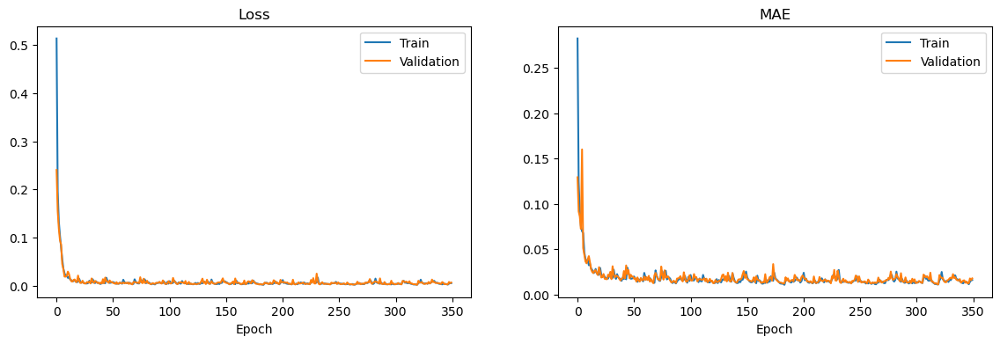

In [140]:
plt.figure(figsize=(14,4))
plt.subplot(1, 2, 1)
plt.title("Loss")
plt.plot(history.history["loss"], label="Train")
plt.plot(history.history["val_loss"], label="Validation")
plt.xlabel("Epoch")
plt.legend()
plt.subplot(1, 2, 2)
plt.title("MAE")
plt.plot(history.history["mae"], label="Train")
plt.plot(history.history["val_mae"], label="Validation")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [141]:
x_try=df_jun[gap_jun].to_numpy()
x_try_scaled = x_scaler.transform(x_try)

y_scaled=model1.predict(x_try_scaled)
y_out=y_scaler.inverse_transform(y_scaled)


45/45 [==============================] - 1s 6ms/step


c:\Users\veglia\.conda\envs\p3_nn\lib\site-packages\matplotlib\text.py:1241: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


<Figure size 700x1000 with 0 Axes>

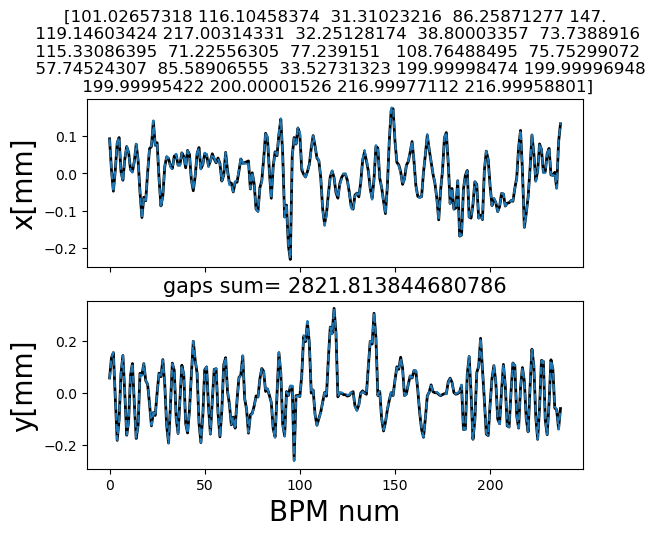

<Figure size 700x1000 with 0 Axes>

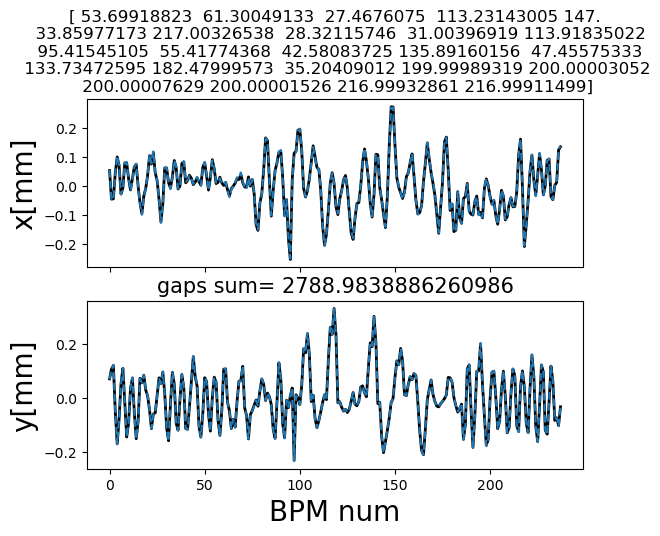

<Figure size 700x1000 with 0 Axes>

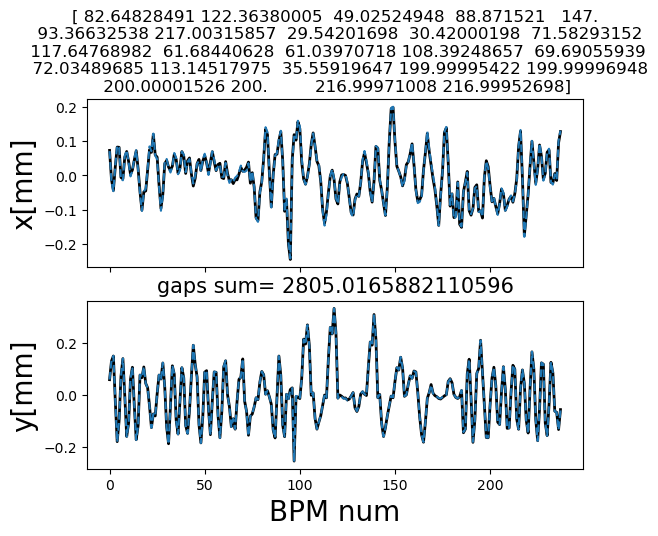

<Figure size 700x1000 with 0 Axes>

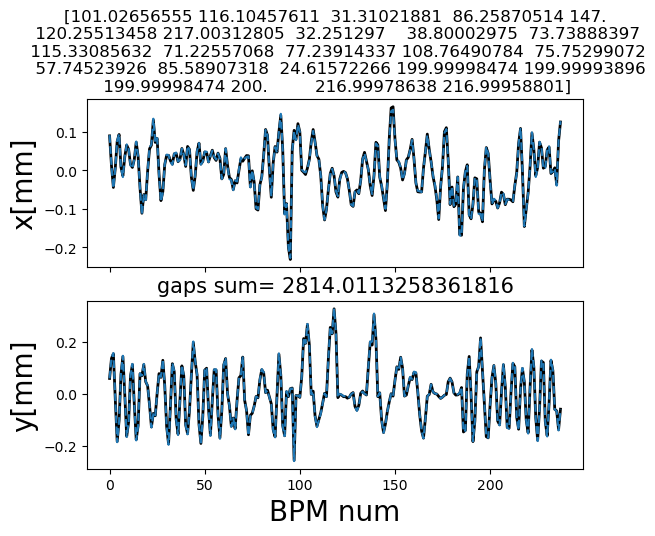

<Figure size 700x1000 with 0 Axes>

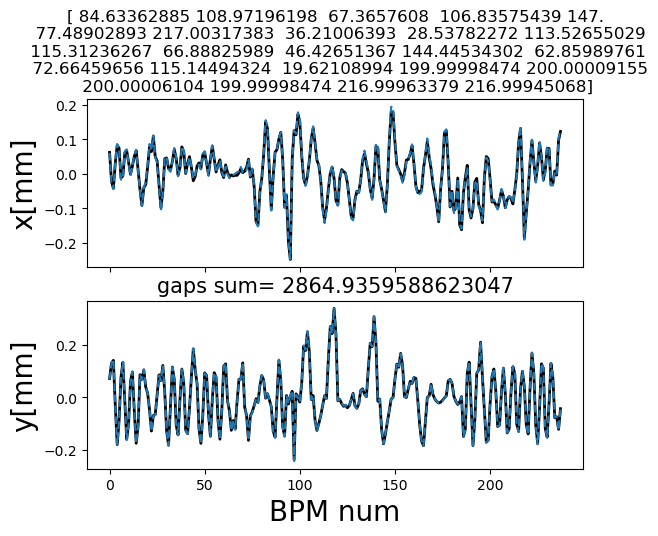

<Figure size 700x1000 with 0 Axes>

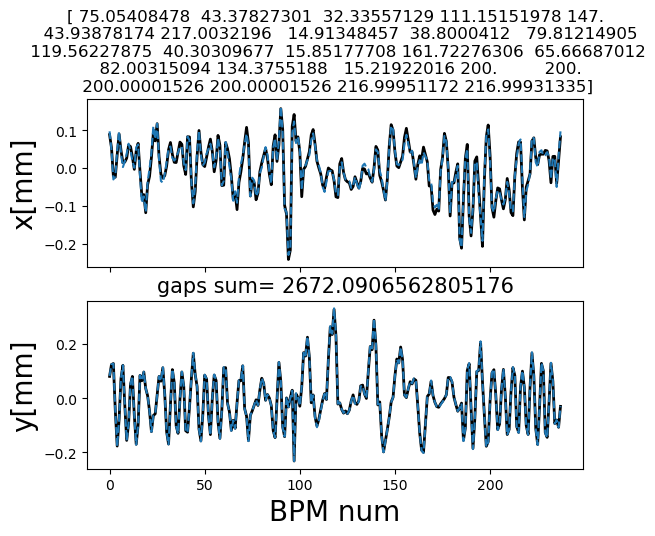

<Figure size 700x1000 with 0 Axes>

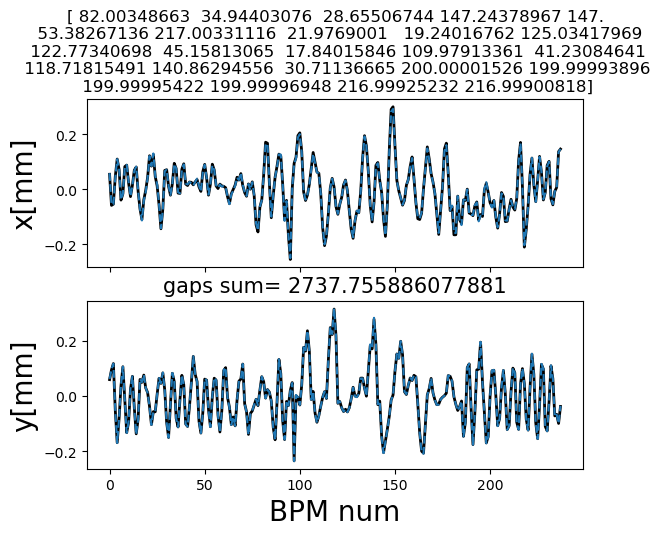

<Figure size 700x1000 with 0 Axes>

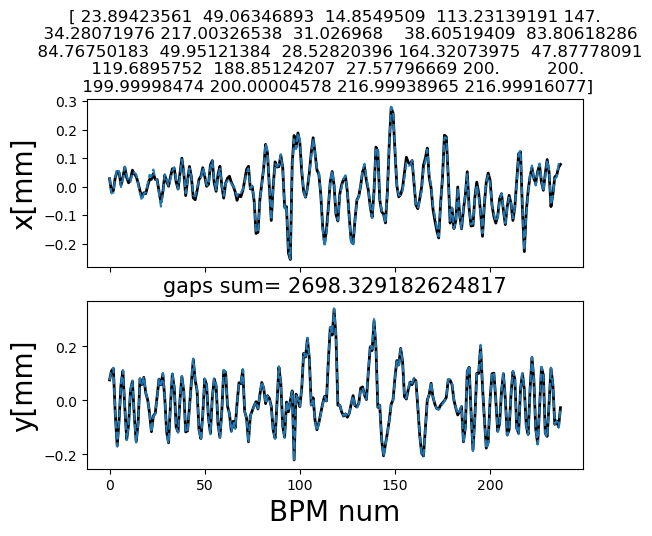

<Figure size 700x1000 with 0 Axes>

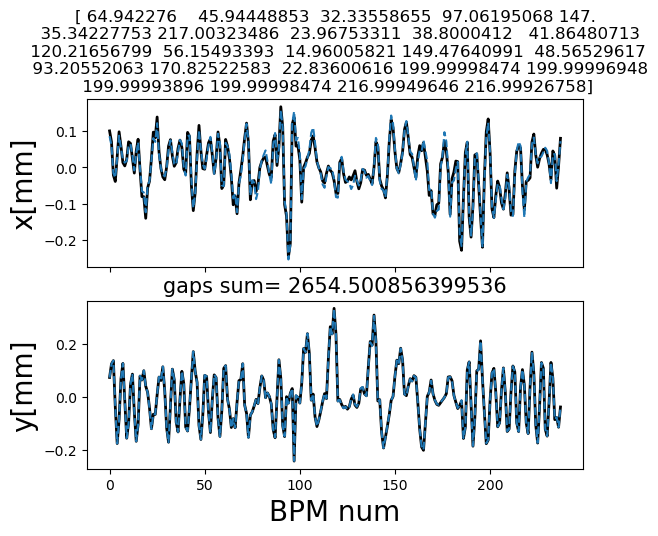

<Figure size 700x1000 with 0 Axes>

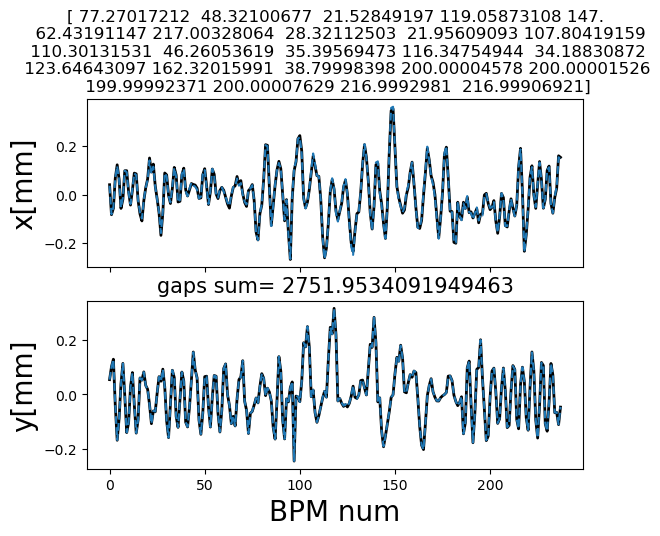

In [144]:
for i in np.random.choice(len(x_try),10):
    fig=plt.figure(figsize=(7,10))
    _,(ax1,ax2)= plt.subplots(2,sharex='col')
    ax1.plot(x_mes_jun[i]*1e-6,c='k',linewidth=2)
    ax1.plot(y_out[i,:238]*1e-6,linestyle='--')
    #ax1.plot(y_out[i,:238],linestyle='--')
    #ax1.plot(y_outRNN[i,:238],linestyle='--')

    #ax1.set_xlabel('BPM num',fontsize=20)
    ax1.title.set_text(x_try[i])
    ax1.set_ylabel('x[mm]',fontsize=20)
    #ax1.set_title("Horizontal",fontsize=20)

    ax2.set_title('gaps sum= '+str(sum(x_try[i])),fontsize=15)
    ax2.plot(y_mes_jun[i]*1e-6,c='k',linewidth=2)
    ax2.plot(y_out[i,238:]*1e-6,linestyle='--')
    #ax2.plot(y_outRNN2[i,238:],linestyle='--')
    #ax2.plot(y_outRNN[i,238:],linestyle='--')


    ax2.set_xlabel('BPM num',fontsize=20)
    ax2.set_ylabel('y[mm]',fontsize=20)

In [143]:
path_n='New_RNN_model_gap2orbit_24_multiple_ok.pt'
model1.save(path_n)

INFO:tensorflow:Assets written to: New_RNN_model_gap2orbit_24_multiple_ok.pt\assets


In [163]:
df_test=pd.read_pickle('data/gap_orbit_OCT23_123844.pkl')
df_test.insert(4,'PU04p',147.00)
gap = df_test.columns[df_test.columns.str.startswith('PU')]

bpms = df_test.columns[df_test.columns.str.startswith('BPM')]

to_drop=list(set(bpms)-set(bpms_tr))
print(to_drop)
df_test = df_test.drop(columns=to_drop)
x_t = df_test.columns[df_test.columns.str.endswith('_x')]
y_t = df_test.columns[df_test.columns.str.endswith('_y')]

df_test[x_t]=df_test[x_t]-np.array(df_op[x_op])
df_test[y_t]=df_test[y_t]-np.array(df_op[y_op])

['BPM_OL_98_y', 'BPM_SWL_31_y', 'BPM_NOR_98_x', 'BPM_NOR_98_y', 'BPM_SOL_24_x', 'BPM_OL_98_x', 'BPM_SOL_24_y', 'BPM_SOR_67_y', 'BPM_NR_19_x', 'BPM_OL_144_x', 'BPM_OR_17_x', 'BPM_OL_75_x', 'BPM_NOR_52_x', 'BPM_SOR_67_x', 'BPM_NR_19_y', 'BPM_NOR_52_y', 'BPM_OL_75_y', 'BPM_OL_144_y', 'BPM_OR_17_y', 'BPM_SWL_31_x']


In [157]:
len(df_test[x_t].iloc[2])

238

In [164]:
x_try1=df_test[gap].to_numpy()
x_try_scaled1 = x_scaler.transform(x_try1)

y_scaled1=model1.predict(x_try_scaled1)
y_out1=y_scaler.inverse_transform(y_scaled1)


9/9 [==============================] - 0s 9ms/step


In [165]:
x_mes1=df_test[x_t].to_numpy()
y_mes1=df_test[y_t].to_numpy()

In [168]:
y_out1[0,:238]
x_mes1

array([[-192537., -112284.,   56515., ...,  229882.,   63377.,  -44955.],
       [-272108., -150991.,   92721., ...,  332540.,   58383., -100171.],
       [-279545., -155868.,   95849., ...,  343619.,   60338., -103973.],
       ...,
       [-180923.,   32908.,  122833., ...,  210522., -115375., -167922.],
       [-175385.,   44428.,  124915., ...,  202507., -126103., -172287.],
       [-179334.,   40214.,  125498., ...,  207521., -124245., -173471.]])

<Figure size 700x1000 with 0 Axes>

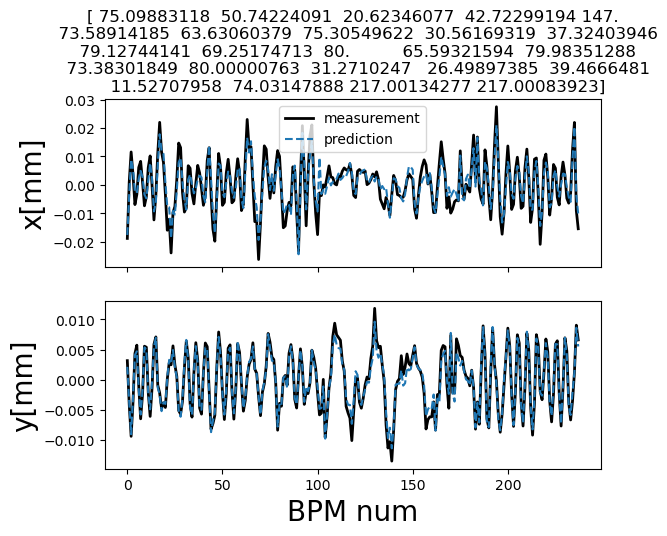

<Figure size 700x1000 with 0 Axes>

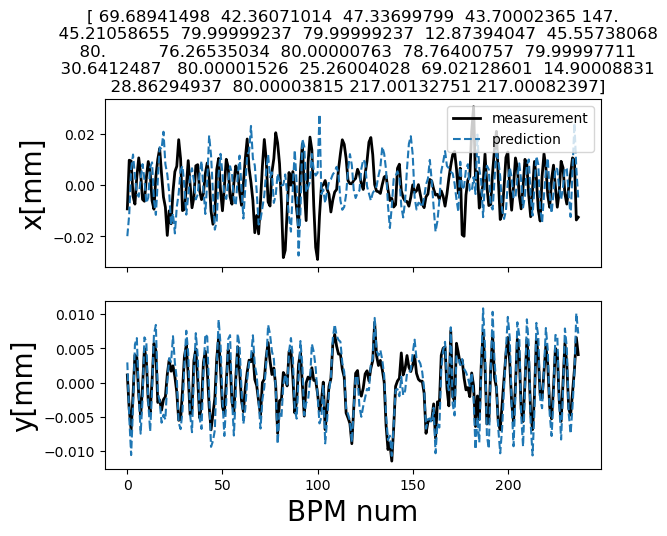

<Figure size 700x1000 with 0 Axes>

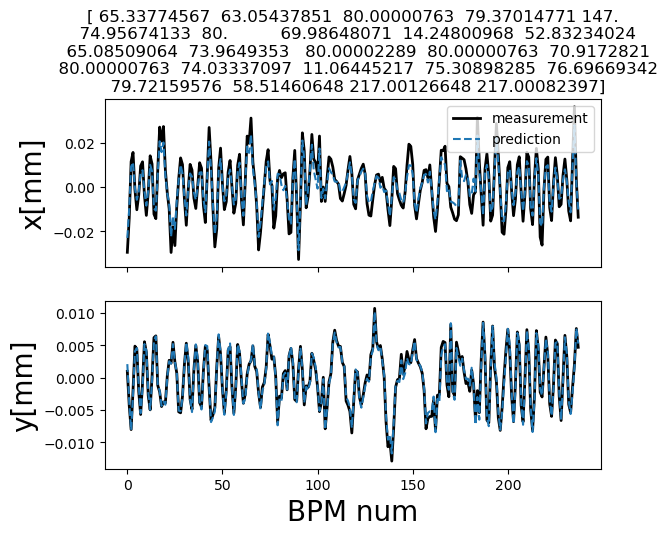

<Figure size 700x1000 with 0 Axes>

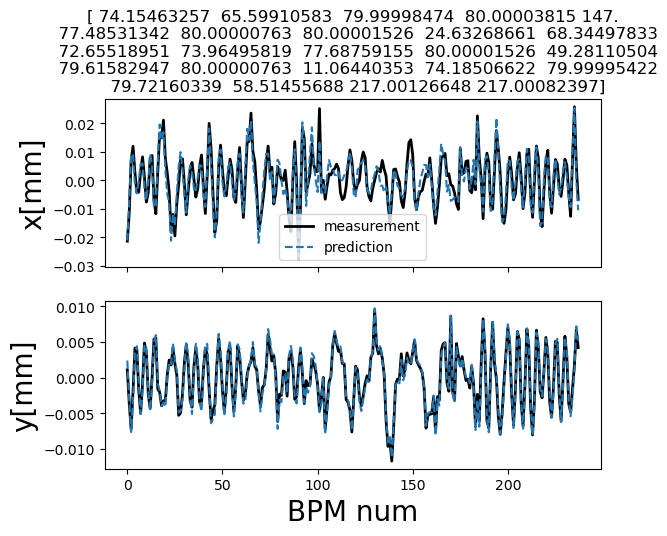

<Figure size 700x1000 with 0 Axes>

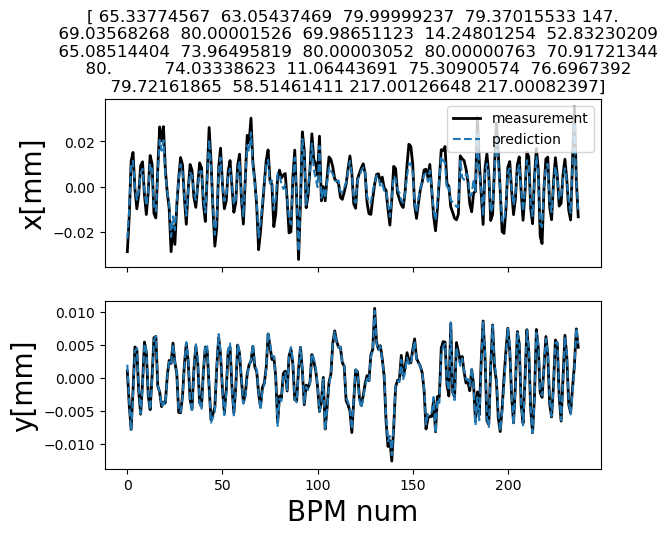

<Figure size 700x1000 with 0 Axes>

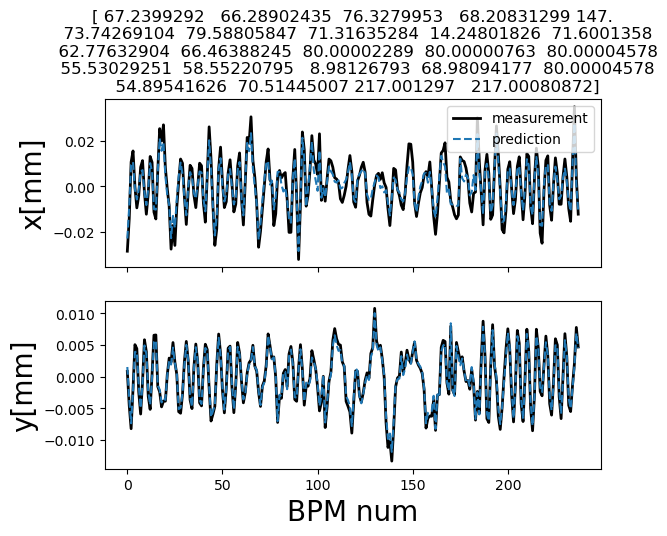

<Figure size 700x1000 with 0 Axes>

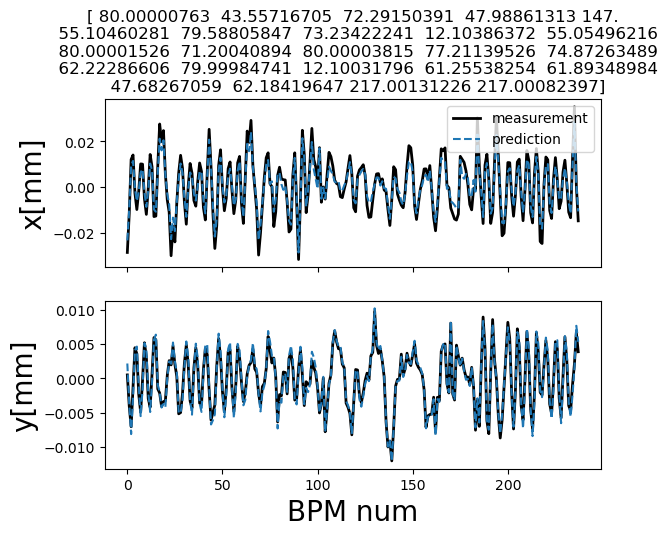

<Figure size 700x1000 with 0 Axes>

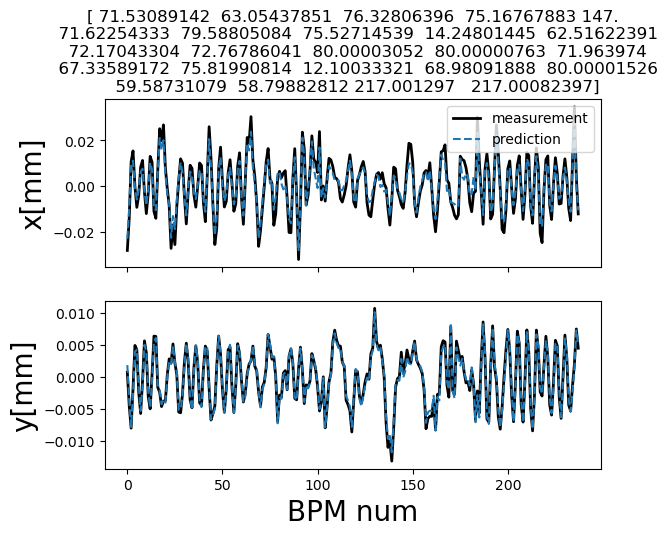

<Figure size 700x1000 with 0 Axes>

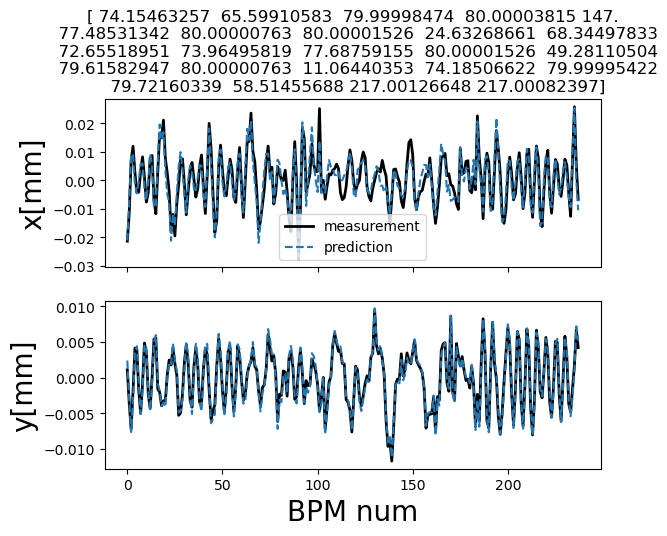

<Figure size 700x1000 with 0 Axes>

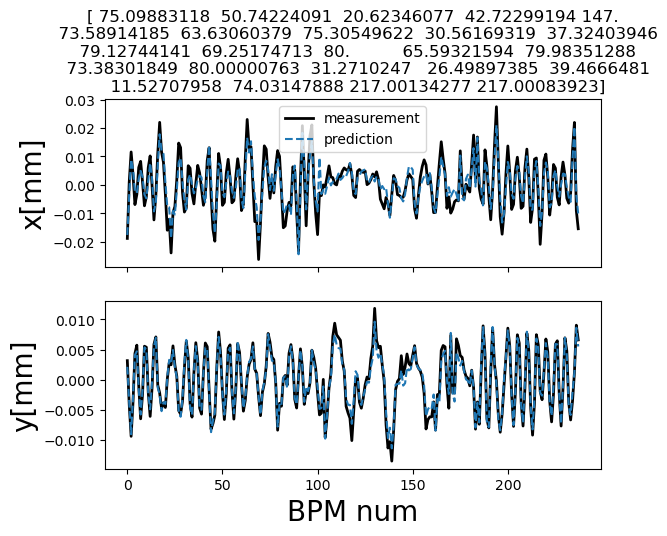

In [173]:
for i in np.random.choice(len(x_try1),10):
    fig=plt.figure(figsize=(7,10))
    _,(ax1,ax2)= plt.subplots(2,sharex='col')
    ax1.plot(x_mes1[i]*1e-7,c='k',linewidth=2,label='measurement')
    ax1.plot(y_out1[i,:238]*1e-7,linestyle='--',label='prediction')
    #ax1.plot(y_outRNN2[i,:238],linestyle='--')
    #ax1.plot(y_outRNN[i,:238],linestyle='--')

    #ax1.set_xlabel('BPM num',fontsize=20)
    ax1.title.set_text(x_try1[i])
    ax1.set_ylabel('x[mm]',fontsize=20)
    ax1.legend()
    #ax1.set_title("Horizontal",fontsize=20)

    #ax2.set_title('gaps sum= '+str(sum(x_try[i])),fontsize=15)
    ax2.plot(y_mes1[i]*1e-7,c='k',linewidth=2)
    ax2.plot(y_out1[i,238:]*1e-7,linestyle='--')
    #ax2.plot(y_outRNN[i,238:],linestyle='--')


    ax2.set_xlabel('BPM num',fontsize=20)
    ax2.set_ylabel('y[mm]',fontsize=20)